# Business Case :

The primary goal of this project is to analyze FIFA player statistics and build meaningful clusters or visual insights that can benefit various stakeholders in the football industry.

### Additional objectives include:

* Understand Player Archetypes: Using clustering (e.g., K-Means, DBSCAN) to identify groups of similar players based on physical, skill, and mental attributes.

* Market Segmentation: Classify players by market value, skill, or potential to make strategic recruitment decisions.

* Feature Impact Evaluation: Determine which player attributes have the most influence on overall performance using PCA and correlation plots.

* Scout Targeting: Help scouts narrow down large databases into targetable, high-potential groups.

* Team Formation Insights: Analyze cluster outputs to aid in forming balanced squads with complementing player types.

* Strategic Investment: Predict which young players are likely to increase in value and performance based on cluster traits.



In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [6]:
data1 = pd.read_csv('players_20.csv')

In [8]:
data1.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


## Domain Analysis :

## Basic Checks

In [7]:
data1.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [8]:
data1.shape

(18278, 104)

In [9]:
list(data1.columns)

['sofifa_id',
 'player_url',
 'short_name',
 'long_name',
 'age',
 'dob',
 'height_cm',
 'weight_kg',
 'nationality',
 'club',
 'overall',
 'potential',
 'value_eur',
 'wage_eur',
 'player_positions',
 'preferred_foot',
 'international_reputation',
 'weak_foot',
 'skill_moves',
 'work_rate',
 'body_type',
 'real_face',
 'release_clause_eur',
 'player_tags',
 'team_position',
 'team_jersey_number',
 'loaned_from',
 'joined',
 'contract_valid_until',
 'nation_position',
 'nation_jersey_number',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic',
 'gk_diving',
 'gk_handling',
 'gk_kicking',
 'gk_reflexes',
 'gk_speed',
 'gk_positioning',
 'player_traits',
 'attacking_crossing',
 'attacking_finishing',
 'attacking_heading_accuracy',
 'attacking_short_passing',
 'attacking_volleys',
 'skill_dribbling',
 'skill_curve',
 'skill_fk_accuracy',
 'skill_long_passing',
 'skill_ball_control',
 'movement_acceleration',
 'movement_sprint_speed',
 'movement_agility',
 'movement_re

In [10]:
data1.dtypes

sofifa_id      int64
player_url    object
short_name    object
long_name     object
age            int64
               ...  
lb            object
lcb           object
cb            object
rcb           object
rb            object
Length: 104, dtype: object

In [11]:
data1.isnull().sum()

sofifa_id        0
player_url       0
short_name       0
long_name        0
age              0
              ... 
lb            2036
lcb           2036
cb            2036
rcb           2036
rb            2036
Length: 104, dtype: int64

In [12]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB


In [13]:
data1.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,...,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,...,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,...,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,...,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,...,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,226165.000000,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,...,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,240795.750000,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,3.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,252905.000000,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,5.000000,5.000000,...,92.000000,96.000000,94.000000,92.000000,90.000000,90.000000,92.000000,93.000000,91.000000,92.000000


## Droping Unwanted Columns
- ### Fifa ID, Player URL, Long Name, Potential, Body Type, Realface, Loaned From, Jersery Number
- ### Joined, Contract Until, National Jersey Number

In [27]:
data2 = data1.copy()

In [29]:
data2.drop(['sofifa_id',"player_url","long_name","real_face","potential","body_type",
           "loaned_from","joined","contract_valid_until","team_jersey_number","nation_jersey_number"], axis=1, inplace=True)

In [31]:
data2.head()

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,value_eur,wage_eur,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,95500000,565000,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,Cristiano Ronaldo,34,1985-02-05,187,83,Portugal,Juventus,93,58500000,405000,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,Neymar Jr,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,105500000,290000,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,J. Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,77500000,125000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,E. Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,90000000,470000,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [18]:
# numerical columns
numerical_cols = data2.select_dtypes(include=['int64', 'float64']).columns

# categorical columns
categorical_cols = data2.select_dtypes(include=['object']).columns


In [19]:
numerical_cols

Index(['age', 'height_cm', 'weight_kg', 'overall', 'value_eur', 'wage_eur',
       'international_reputation', 'weak_foot', 'skill_moves',
       'release_clause_eur', 'pace', 'shooting', 'passing', 'dribbling',
       'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking',
       'gk_reflexes', 'gk_speed', 'gk_positioning', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking', 'defending_s

In [20]:
categorical_cols

Index(['short_name', 'dob', 'nationality', 'club', 'player_positions',
       'preferred_foot', 'work_rate', 'player_tags', 'team_position',
       'nation_position', 'player_traits', 'ls', 'st', 'rs', 'lw', 'lf', 'cf',
       'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb',
       'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'],
      dtype='object')

In [33]:
# To define the position-related columns
position_cols = ['rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm',
                 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb','ls','st','rs','lw','lf'	,'cf']


In [35]:
# place missing values with a placeholder
data2[position_cols] = data2[position_cols].fillna('Unknown')

In [37]:
data2.isnull().sum()
# Null values treated.

short_name    0
age           0
dob           0
height_cm     0
weight_kg     0
             ..
lb            0
lcb           0
cb            0
rcb           0
rb            0
Length: 93, dtype: int64

In [39]:
# Treating the objects cols.

def convert_position_rating(value):
    try:
        if isinstance(value, str):  # to check dtype of the data
            if value.lower() == 'unknown':
                return np.nan  # To return '0' if there is null value
            elif '+' in value:
                base, boost = value.split('+')
                return int(base) + int(boost)  # To add the numbers after converting to int
            else:
                return int(value)
        elif isinstance(value, (int, float)):  # Already numeric
            return value
        else:
            return np.nan 
    except:
        return np.nan



In [41]:
# paste it for the required cols alone.
for col in position_cols:
    data2[col] = data2[col].apply(convert_position_rating) # applying this to every object cols present.

In [42]:
data2.dtypes

short_name     object
age             int64
dob            object
height_cm       int64
weight_kg       int64
               ...   
lb            float64
lcb           float64
cb            float64
rcb           float64
rb            float64
Length: 93, dtype: object

In [45]:
data2[position_cols] = data2[position_cols].fillna(0).astype(int)

In [47]:
# Converting float columns to int :
data2[position_cols] = data2[position_cols].astype(int)

In [49]:
# Now display null values count for all columns

pd.set_option('display.max_rows', None)

data2.isnull().sum()


short_name                        0
age                               0
dob                               0
height_cm                         0
weight_kg                         0
nationality                       0
club                              0
overall                           0
value_eur                         0
wage_eur                          0
player_positions                  0
preferred_foot                    0
international_reputation          0
weak_foot                         0
skill_moves                       0
work_rate                         0
release_clause_eur             1298
player_tags                   16779
team_position                   240
nation_position               17152
pace                           2036
shooting                       2036
passing                        2036
dribbling                      2036
defending                      2036
physic                         2036
gk_diving                     16242
gk_handling                 

In [51]:
# Total Number of Null values
data2.isnull().sum().sum()

155849

# UNIVARIATE ANALYSIS : 

<Axes: xlabel='preferred_foot', ylabel='count'>

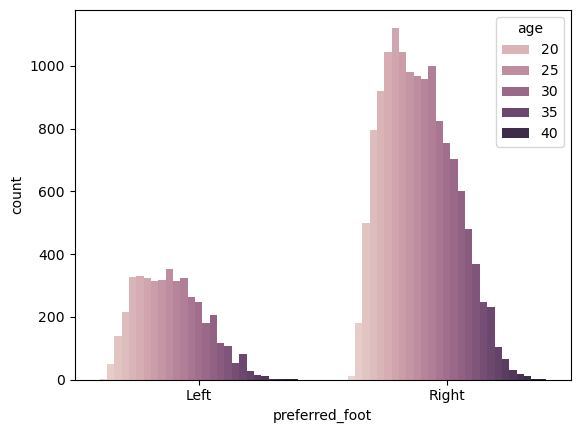

In [20]:
sns.countplot(data = data1 , x = 'preferred_foot', hue = 'age')

## INSIGHTS :
* Its clear that majority of players in the dataset are right-footed, significantly outnumbering left-footed players across all age groups.
- For both preferred feet, the highest concentration of players is in the younger age groups [ 20-25 years old ], with the count gradually decreasing as age increases.
* The decline in player count with increasing age falls more for right-footed players in absolute numbers due to their larger overall representation.

## Task - 2

In [32]:
# GROUPING THE SKILL SECTION ALONE :
attacking = [
    'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy',
    'attacking_short_passing', 'attacking_volleys'
]
goalkeeping = [
    'goalkeeping_diving', 'goalkeeping_handling',
    'goalkeeping_kicking', 'goalkeeping_positioning',
    'goalkeeping_reflexes'
]
defending = [
    'defending_marking', 'defending_standing_tackle',
    'defending_sliding_tackle'
]
mentality = [
    'mentality_aggression', 'mentality_interceptions',
    'mentality_positioning', 'mentality_vision',
    'mentality_penalties', 'mentality_composure'
]
power = [
    'power_shot_power', 'power_jumping', 'power_stamina',
    'power_strength', 'power_long_shots'
]
movement = [
    'movement_acceleration', 'movement_sprint_speed',
    'movement_agility', 'movement_reactions', 'movement_balance'
]
skill = [
    'skill_dribbling', 'skill_curve', 'skill_fk_accuracy',
    'skill_long_passing', 'skill_ball_control'
]

# Every column is grouped into a category so that, category will be easy to segreagte to the model.


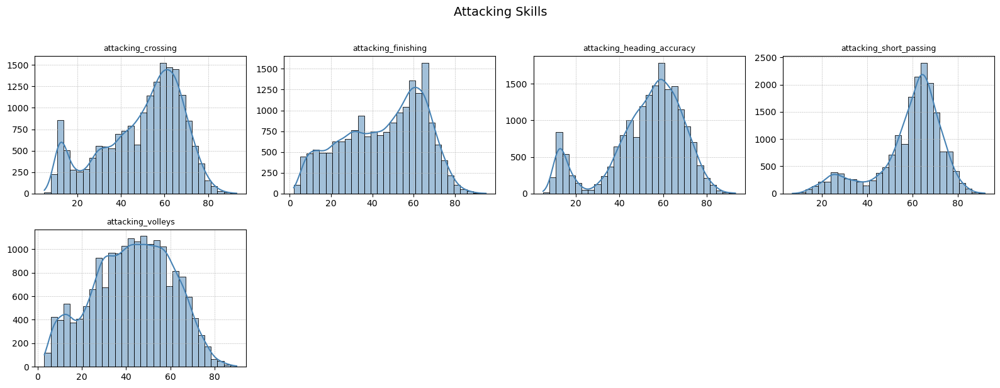

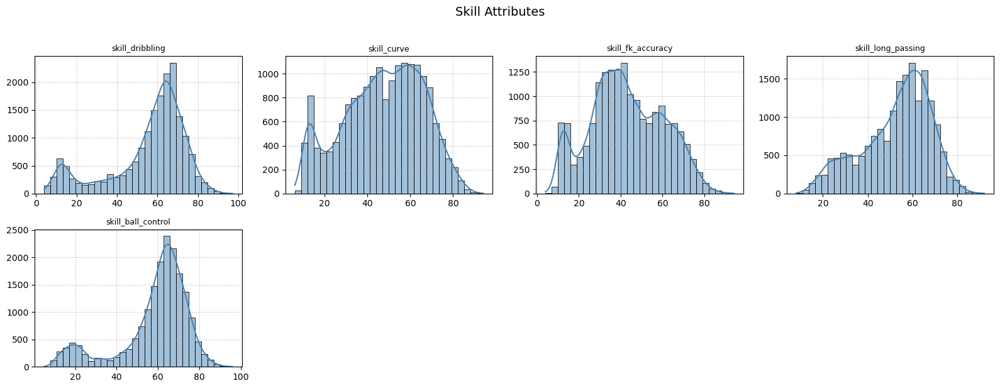

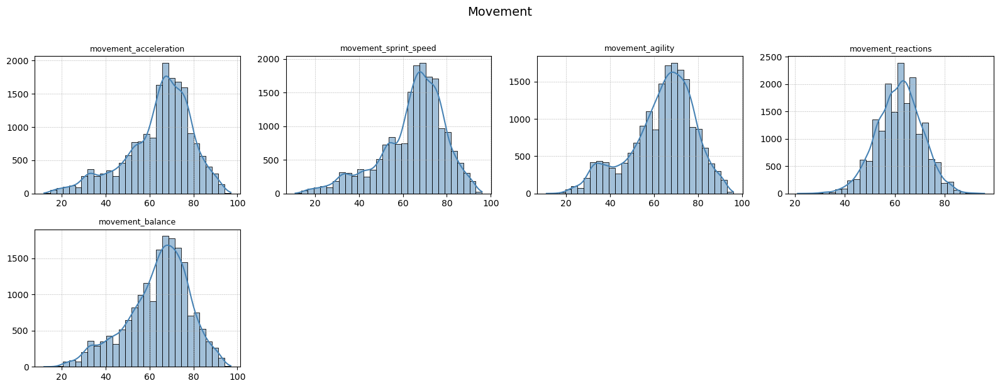

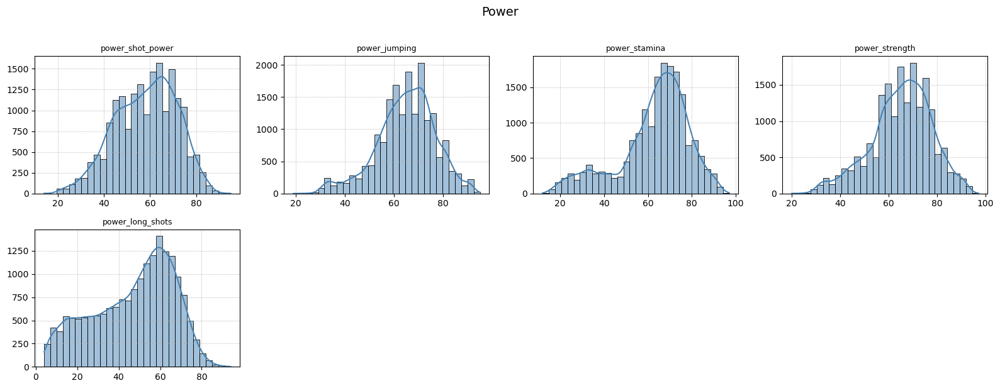

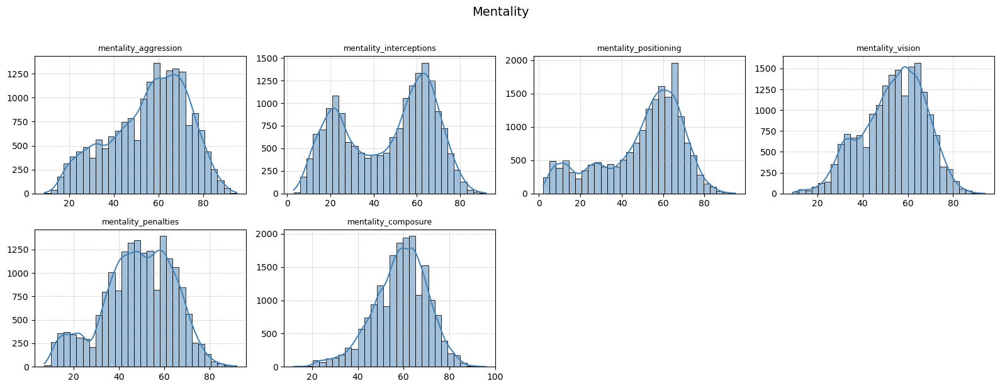

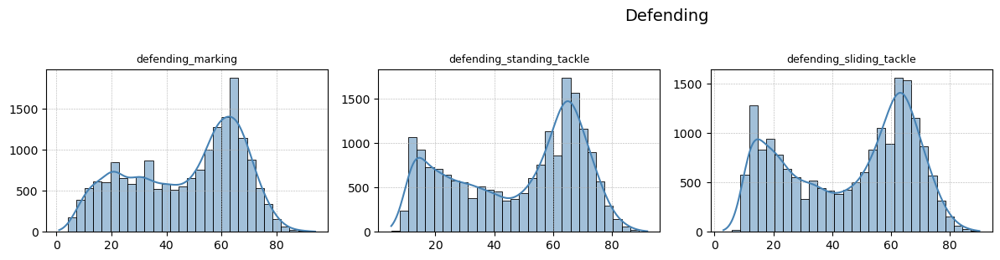

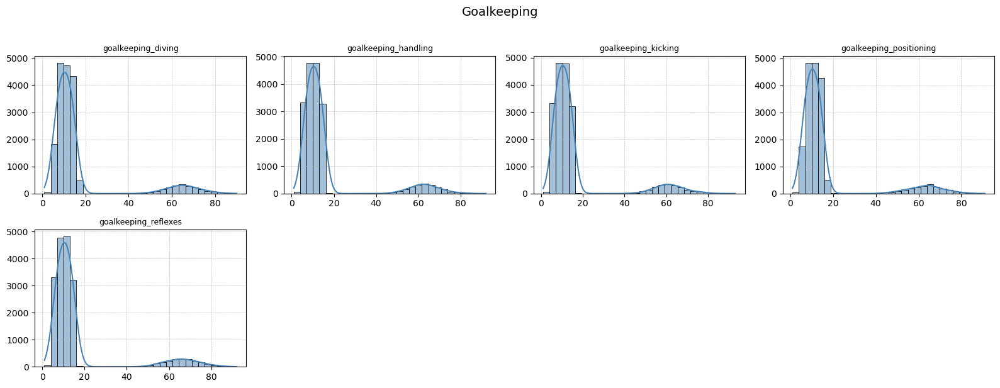

In [33]:
# Grouped skill categories
skill_groups = {
    'Attacking Skills': attacking,
    'Skill Attributes': skill,
    'Movement': movement,
    'Power': power,
    'Mentality': mentality,
    'Defending': defending,
    'Goalkeeping': goalkeeping
}

plots_per_row = 4
plot_width = 4
plot_height = 3

# Plot each skill group in compact form
for group_name, cols in skill_groups.items():
    rows = (len(cols) + plots_per_row - 1) // plots_per_row
    plt.figure(figsize=(plot_width * plots_per_row, plot_height * rows))
    
    for i, col in enumerate(cols, 1):
        plt.subplot(rows, plots_per_row, i)
        sns.histplot(data2[col], kde=True, bins=30, color='steelblue')
        plt.title(col, fontsize=9)
        plt.xlabel('')
        plt.ylabel('')
        plt.grid(True, linestyle='--', linewidth=0.4)
    
    plt.suptitle(group_name, fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()


# INSIGHTS :

- We can see most players shows moderate 'attacking and skill attributes', with distributions generally peaking between 50 and 70, indicating a group of  well-rounded players in these areas.
- Mentality attributes -  like aggression, interceptions, and vision also show a broad spread, but peaks can be noticed in the 60-70 range, suggesting  that a certain portion of players possess decent mental game understanding.
- Defending skills - (marking, standing tackle, sliding tackle) display 2 -type distribution, indicating distinct groups of players, likely specialists and non-specialists, with peaks around 30-40 and 60-70.
- Movement and power attributes -  (acceleration, sprint speed, agility, reactions, shot power, stamina, strength) are generally higher compared to other skill categories, with a large amount of players having scores between 60 and 80, highlighting a strong physical foundation for many.

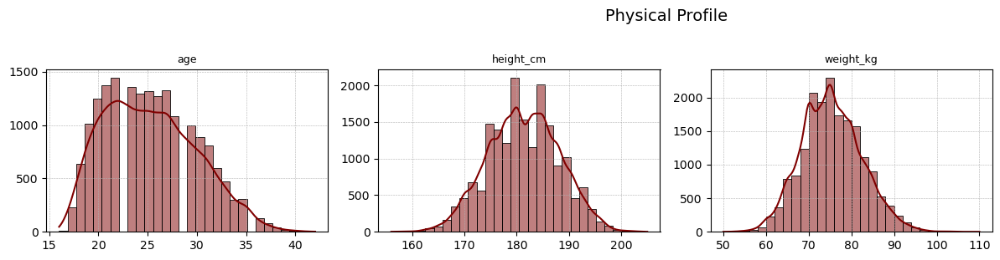

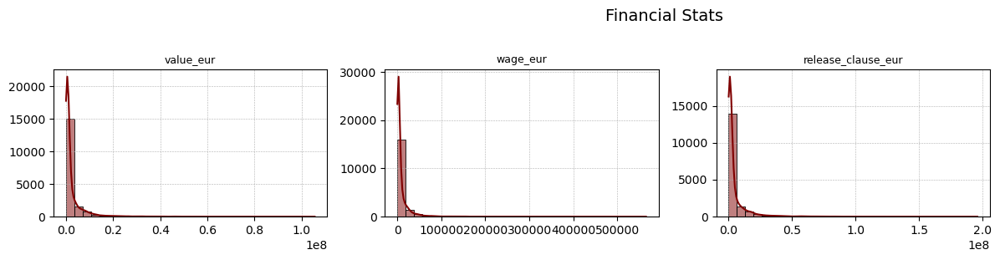

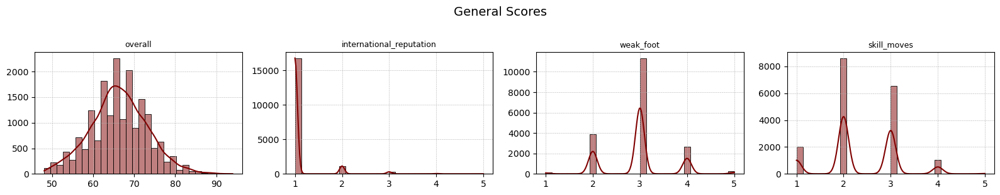

In [35]:
extra_groups = {
    'Physical Profile': ['age', 'height_cm', 'weight_kg'],
    'Financial Stats': ['value_eur', 'wage_eur', 'release_clause_eur'],
    'General Scores': ['overall', 'international_reputation', 'weak_foot', 'skill_moves']
}

# Parameters for compact layout
plots_per_row = 4
plot_width = 4  # per subplot
plot_height = 3  # per row

# Plotting loop
for group, cols in extra_groups.items():
    rows = (len(cols) + plots_per_row - 1) // plots_per_row  # calculate needed rows
    plt.figure(figsize=(plot_width * plots_per_row, plot_height * rows))
    
    for i, col in enumerate(cols, 1):
        plt.subplot(rows, plots_per_row, i)
        sns.histplot(data2[col], kde=True, bins=30, color='maroon')
        plt.title(col, fontsize=9)
        plt.xlabel('')
        plt.ylabel('')
        plt.grid(True, linestyle='--', linewidth=0.4)
    
    plt.suptitle(group, fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()


# INSIGHTS : 
- The majority of players are in their early to mid-20s, with a clear peak around 20-25 years old.
- Player 'heights' are mostly between 175 cm and 185 cm, and weights are primarily in the 70-80 kg range, indicating a typical physical profile.
- Metrics like 'value_eur, wage_eur, and release_clause_eur' show a highly skewed distribution, with most players having relatively low values and a few outliers with significantly higher financial figures.
- The 'overall' scores are normally distributed, peaking around 70-75, suggesting a Gaussian curve of general player ability, while 'international_reputation, weak_foot, and skill_moves' tend to cluster at lower values with fewer players having high ratings in these specific areas.

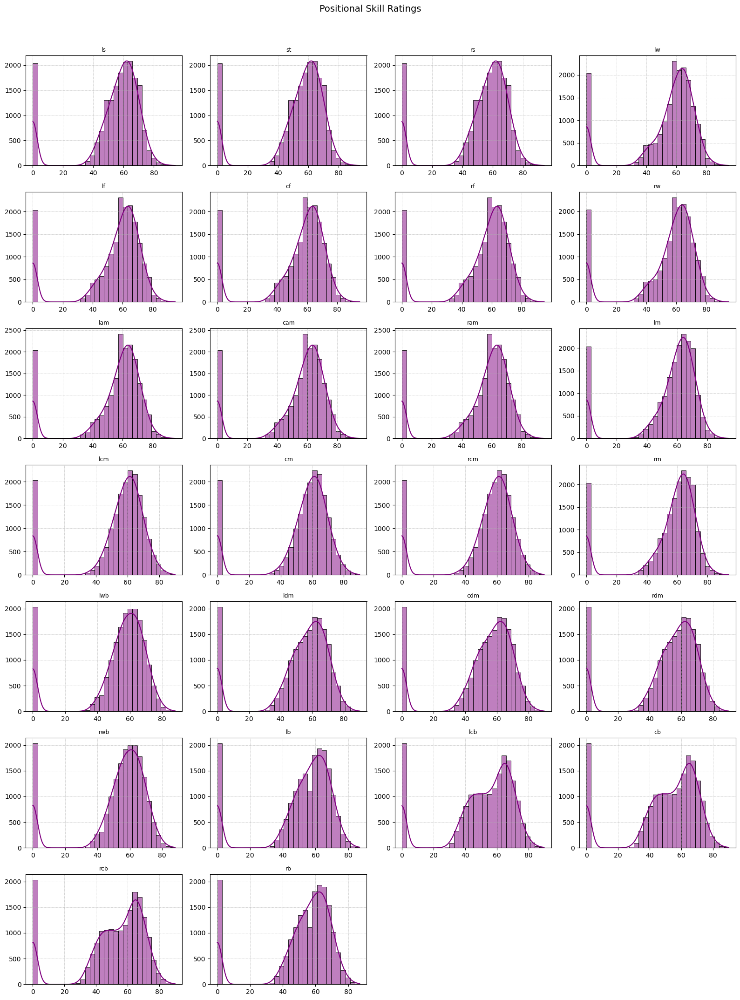

In [37]:
# Position Rating Plots – Numeric cols
plots_per_row = 4
plot_width = 4
plot_height = 3

position_ratings = [
    'ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw',
    'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm',
    'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'
]

rows = (len(position_ratings) + plots_per_row - 1) // plots_per_row
plt.figure(figsize=(plot_width * plots_per_row, plot_height * rows))

for i, col in enumerate(position_ratings, 1):
    plt.subplot(rows, plots_per_row, i)
    sns.histplot(data2[col], kde=True, bins=30, color='purple')
    plt.title(col, fontsize=9)
    plt.xlabel('')
    plt.ylabel('')
    plt.grid(True, linestyle='--', linewidth=0.4)

plt.suptitle("Positional Skill Ratings", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

# Is the plot neccassary ?

## Task 3 

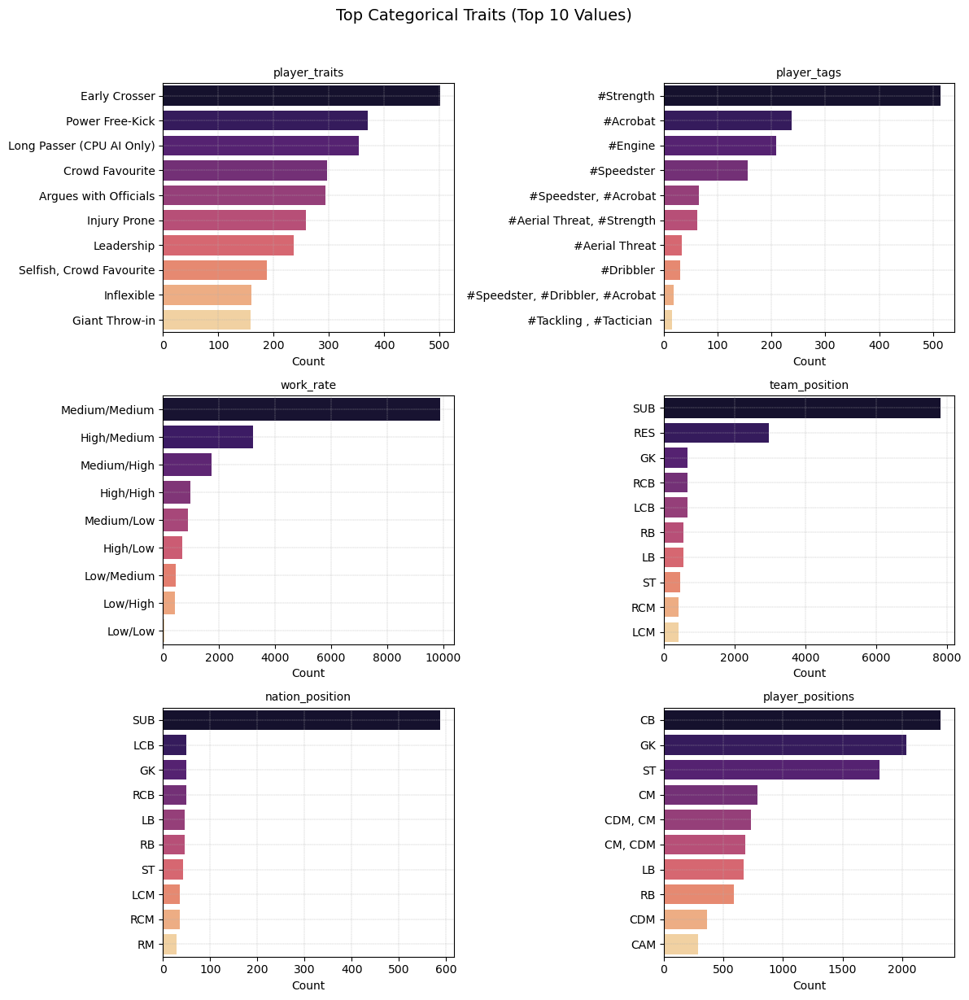

In [53]:
# Player Traits – Categorical Plot
trait_cats = [
    'player_traits', 'player_tags',
    'work_rate', 'team_position', 'nation_position', 'player_positions'
]

plots_per_row = 2
rows = (len(trait_cats) + plots_per_row - 1) // plots_per_row
plt.figure(figsize=(6 * plots_per_row, 4 * rows))

for i, col in enumerate(trait_cats, 1):
    plt.subplot(rows, plots_per_row, i)
    top_values = data2[col].value_counts().nlargest(10)
    sns.barplot(x=top_values.values, y=top_values.index, palette='magma')
    plt.title(col, fontsize=10)
    plt.xlabel('Count')
    plt.ylabel('')
    plt.grid(True, linestyle='--', linewidth=0.3)

plt.suptitle("Top Categorical Traits (Top 10 Values)", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()


## INSIGHTS :

- "Early Crosser" is the most prevalent individual player trait, while "#Strength" is the most common player tag, indicating difference in describing player characteristics.

- While some traits like "Power Free-Kick" and "Long Passer" are specific individual abilities, tags like "#Speedster, #Acrobat" suggest combinations of attributes are also common ways to categorize players.
- "SUB" (Substitute) seems the most frequent team_position, indicating that a large portion of the dataset represents players who are not regular starters for their clubs.

- In contrast to club positions, nation_position has significantly fewer data points, with "SUB" still being the most common, but national team call-ups for other positions are much less frequent.

# Bivariate Analysis

In [40]:
# Filter players with striker roles
strikers = data2[data2['player_positions'].str.contains('ST|CF|LF|RF', na=False)]

# Get top 10 strikers by overall
top_10_strikers = strikers[['short_name', 'overall']].sort_values(by='overall', ascending=False).head(10)
print(top_10_strikers)


           short_name  overall
0            L. Messi       94
1   Cristiano Ronaldo       93
4           E. Hazard       91
9            M. Salah       90
10          K. Mbappé       89
12            H. Kane       89
17          S. Agüero       89
19          L. Suárez       89
20     R. Lewandowski       89
22       A. Griezmann       89


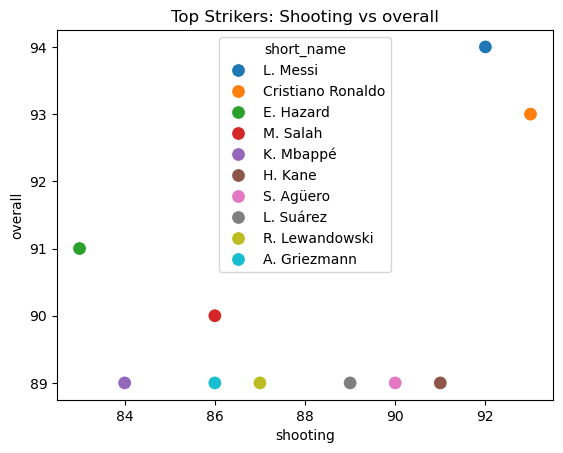

In [41]:
# Top 10 Strikers by Overall
top_strikers = strikers.sort_values(by='overall', ascending=False).head(10)

# Plot: Finishing vs Shooting
sns.scatterplot(data=top_strikers, x='shooting', y='overall', hue='short_name', s=100)
plt.title("Top Strikers: Shooting vs overall")
plt.show()


## INSIGHTS :
- L. Messi stands out with the highest overall rating (94) among these top strikers, demonstrating exceptional all-around ability despite not having the highest shooting score.


In [42]:
# Filter only goalkeepers
goalkeepers = data2[data2['player_positions'].str.contains('GK', na=False)]

# Get top 10 goalkeepers by overall rating
top_10_gks = goalkeepers[['short_name', 'overall']].sort_values(by='overall', ascending=False).head(10)
print(top_10_gks)


       short_name  overall
3        J. Oblak       91
6   M. ter Stegen       90
13        Alisson       89
14         De Gea       89
25        Ederson       88
28    T. Courtois       88
30  S. Handanovič       88
31       M. Neuer       88
32      H. Lloris       88
53       K. Navas       87


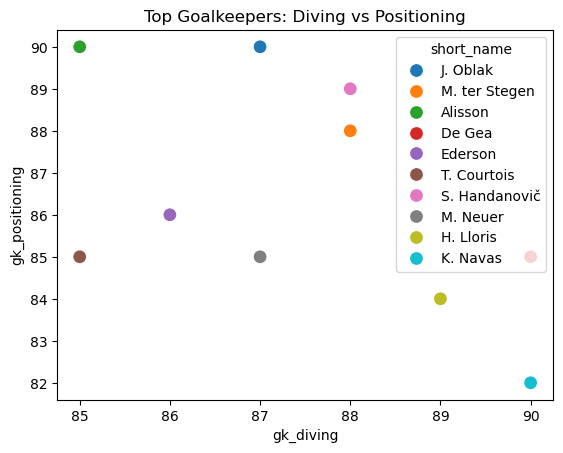

In [43]:
top_gks = goalkeepers.sort_values(by='overall', ascending=False).head(10)

# Plot: GK Diving vs Positioning
sns.scatterplot(data=top_gks, x='gk_diving', y='gk_positioning', hue='short_name', s=100)
plt.title("Top Goalkeepers: Diving vs Positioning")
plt.show()


In [44]:
# Filter players with defender roles
defenders = data2[data2['player_positions'].str.contains('CB|LB|RB|LWB|RWB', na=False)]

# Get top 10 defenders by overall rating
top_10_defenders = defenders[['short_name', 'overall']].sort_values(by='overall', ascending=False).head(10)
print(top_10_defenders)


       short_name  overall
7     V. van Dijk       90
16   G. Chiellini       89
18   Sergio Ramos       89
11   K. Koulibaly       89
29          Piqué       88
35       D. Godín       88
40     A. Laporte       87
45   Thiago Silva       87
47  J. Vertonghen       87
49     M. Hummels       87


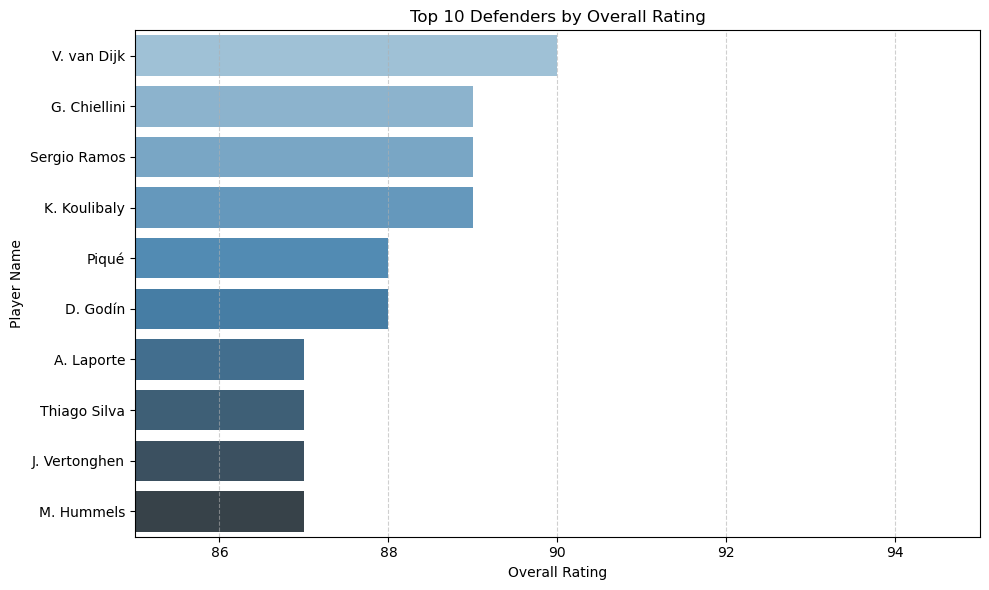

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(data=top_10_defenders, x='overall', y='short_name', palette='Blues_d')

plt.title("Top 10 Defenders by Overall Rating")
plt.xlabel("Overall Rating")
plt.ylabel("Player Name")
plt.xlim(85, 95)  # adjust if needed
plt.grid(True, axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


## INSIGHTS : 

- There's a noticeable drop in overall rating after the top 4 defenders, with the remaining players clustered between approximately 87 and 88.
- Virgil van Dijk has the highest overall rating among the top 10 defenders shown, scoring above 90.


In [46]:
# Filter players with midfield roles
midfielders = data2[data2['player_positions'].str.contains('CM|CDM|CAM|LM|RM|LCM|RCM|LAM|RAM', na=False)]

# Get top 10 midfielders by overall rating
top_10_midfielders = midfielders[['short_name', 'overall']].sort_values(by='overall', ascending=False).head(10)
print(top_10_midfielders)


         short_name  overall
2         Neymar Jr       92
5      K. De Bruyne       91
8         L. Modrić       90
15         N. Kanté       89
21  Sergio Busquets       89
23        P. Dybala       88
24         P. Pogba       88
27       C. Eriksen       88
33      David Silva       88
36         T. Kroos       88


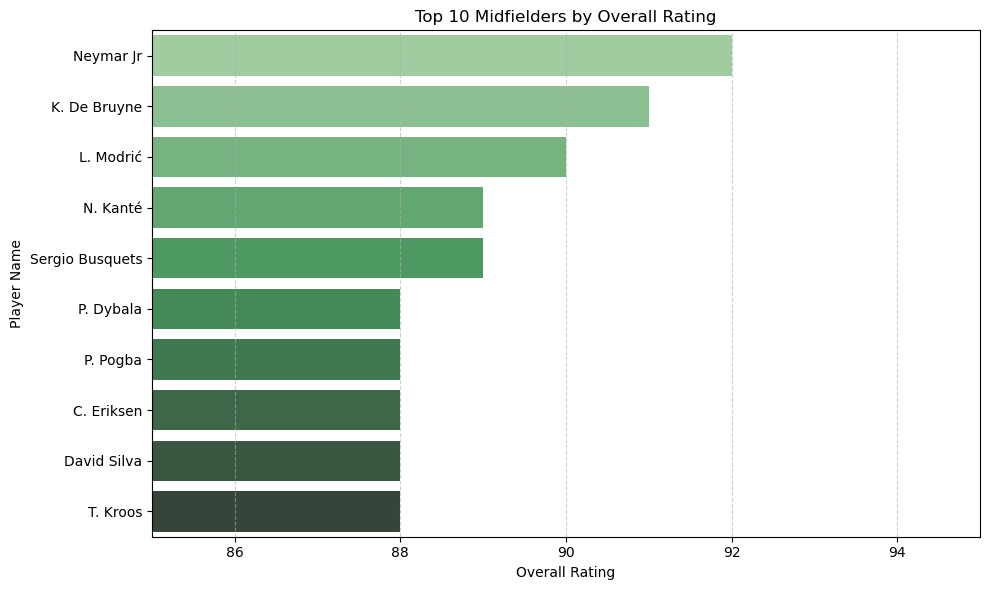

In [47]:
plt.figure(figsize=(10, 6))
sns.barplot(data=top_10_midfielders, x='overall', y='short_name', palette='Greens_d')

plt.title("Top 10 Midfielders by Overall Rating")
plt.xlabel("Overall Rating")
plt.ylabel("Player Name")
plt.xlim(85, 95)  # adjust as needed
plt.grid(True, axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


## INSIGHTS :
- Neymar Jr. leads the list of top 10 midfielders by overall rating, scoring above 92.

- There's a clear drop in overall rating after the top 4 midfielders, with the remaining players scoring between approximately 88 and 89.

In [48]:
# Filter players with striker roles
strikers = data2[data2['player_positions'].str.contains('ST|CF|LF|RF', na=False)]

# Get top 10 strikers by overall
top_10_strikers = strikers[['short_name', 'overall']].sort_values(by='overall', ascending=False).head(10)
print(top_10_strikers)


           short_name  overall
0            L. Messi       94
1   Cristiano Ronaldo       93
4           E. Hazard       91
9            M. Salah       90
10          K. Mbappé       89
12            H. Kane       89
17          S. Agüero       89
19          L. Suárez       89
20     R. Lewandowski       89
22       A. Griezmann       89


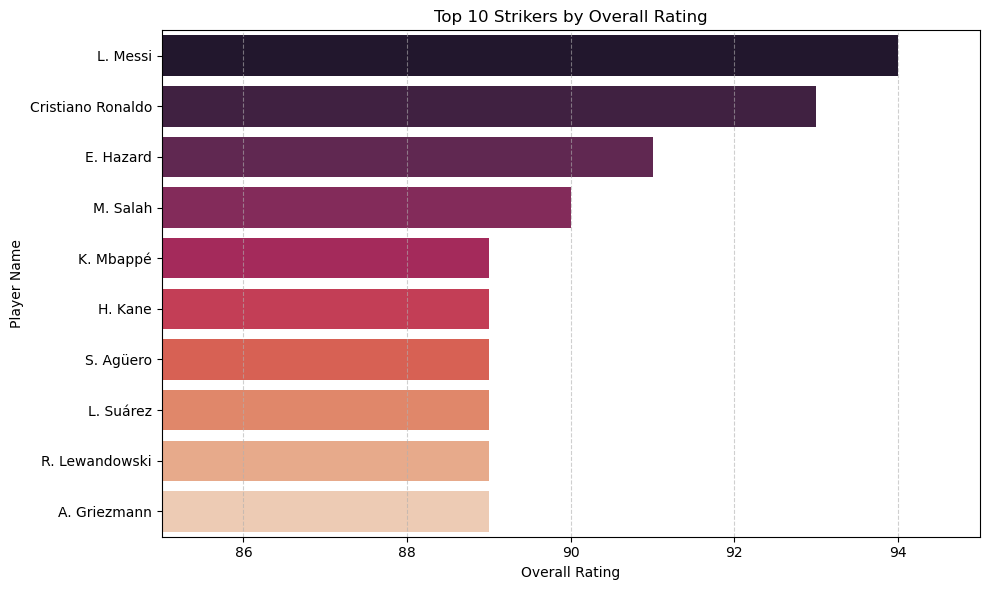

In [49]:
# Top 10 Strikers with best overall
plt.figure(figsize=(10, 6))
sns.barplot(data=top_10_strikers, x='overall', y='short_name', palette='rocket')

plt.title("Top 10 Strikers by Overall Rating")
plt.xlabel("Overall Rating")
plt.ylabel("Player Name")
plt.xlim(85, 95)  # optional: adjust based on your data
plt.grid(True, axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


# INSIGHTS :

* Lionel Messi has the highest overall rating among the top 10 strikers, scoring above 94.
  
* There is a significant gap in overall rating between the top two strikers (Messi and Ronaldo) and the rest of the players on the list.

In [50]:
# Top 10 goalkeepers
goalkeepers = data2[data2['player_positions'].str.contains('GK', na=False)]

# Get top 10 goalkeepers by overall rating
top_10_gks = goalkeepers[['short_name', 'overall']].sort_values(by='overall', ascending=False).head(10)
print(top_10_gks)


       short_name  overall
3        J. Oblak       91
6   M. ter Stegen       90
13        Alisson       89
14         De Gea       89
25        Ederson       88
28    T. Courtois       88
30  S. Handanovič       88
31       M. Neuer       88
32      H. Lloris       88
53       K. Navas       87


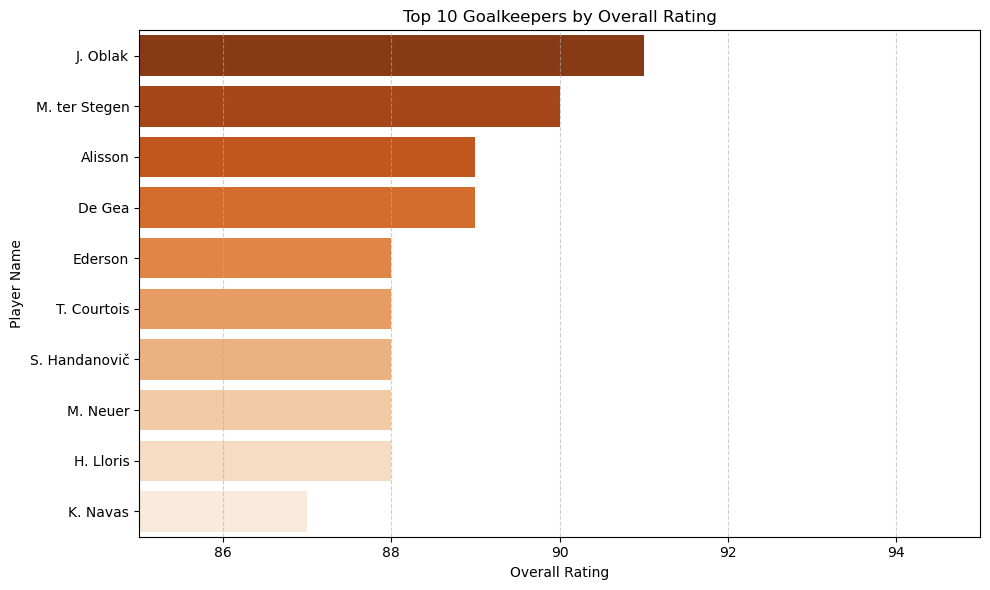

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(data=top_10_gks, x='overall', y='short_name', palette='Oranges_r')

plt.title("Top 10 Goalkeepers by Overall Rating")
plt.xlabel("Overall Rating")
plt.ylabel("Player Name")
plt.xlim(85, 95)  # adjust based on data
plt.grid(True, axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


# INSIGHTS :
- Jan Oblak is the top-ranked goalkeeper with an overall rating above 91, noticeably higher than the rest.

- The ratings for goalkeepers from Ederson downwards are very close, all falling within the 87-88 range.

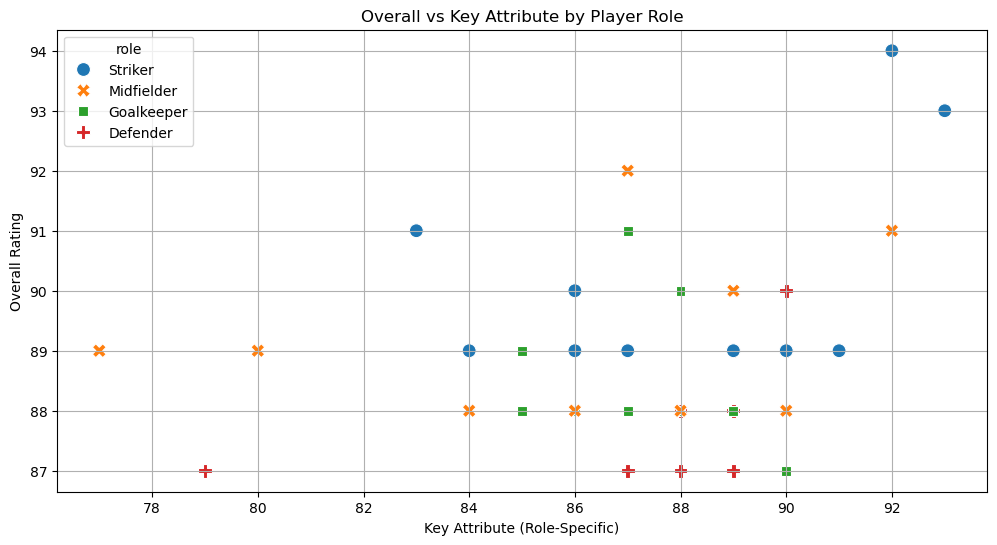

In [52]:
# Extracting top players by role and relevant attributes
striker_df = strikers[['short_name', 'overall', 'shooting']].copy()
striker_df['role'] = 'Striker'
striker_df = striker_df.rename(columns={'shooting': 'key_attribute'})

defender_df = defenders[['short_name', 'overall', 'defending']].copy()
defender_df['role'] = 'Defender'
defender_df = defender_df.rename(columns={'defending': 'key_attribute'})

midfielder_df = midfielders[['short_name', 'overall', 'passing']].copy()
midfielder_df['role'] = 'Midfielder'
midfielder_df = midfielder_df.rename(columns={'passing': 'key_attribute'})

goalkeeper_df = goalkeepers[['short_name', 'overall', 'gk_diving']].copy()
goalkeeper_df['role'] = 'Goalkeeper'
goalkeeper_df = goalkeeper_df.rename(columns={'gk_diving': 'key_attribute'})

# Combine all into one DataFrame
combined_roles = pd.concat([striker_df, defender_df, midfielder_df, goalkeeper_df], ignore_index=True)

# Optional: Keep only top N for clarity
combined_roles = combined_roles.sort_values(by='overall', ascending=False).groupby('role').head(10)

# Bivariate plot
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.scatterplot(data=combined_roles, x='key_attribute', y='overall', hue='role', style='role', s=100)
plt.title("Overall vs Key Attribute by Player Role")
plt.xlabel("Key Attribute (Role-Specific)")
plt.ylabel("Overall Rating")
plt.grid(True)
plt.show()


# INSIGHTS :
- Strikers generally are the highest overall ratings, with several players scoring 90 or above.

- There is no strong linear correlation between a player's key attribute and their overall rating across all roles, as demonstrated by the scattered distribution of points.

- Goalkeepers and defenders tend to have lower overall ratings compared to strikers and midfielders, with most concentrated below 90.
 

In [53]:
# STRIKERS
strikers = data2[data2['player_positions'].str.contains('ST|CF|LF|RF', na=False)]
top_strikers = strikers[['short_name', 'overall']].sort_values(by='overall', ascending=False).head(10)
top_strikers['role'] = 'Striker'

# MIDFIELDERS
midfielders = data2[data2['player_positions'].str.contains('CM|CDM|CAM|LM|RM|LCM|RCM|LAM|RAM', na=False)]
top_midfielders = midfielders[['short_name', 'overall']].sort_values(by='overall', ascending=False).head(10)
top_midfielders['role'] = 'Midfielder'

# DEFENDERS
defenders = data2[data2['player_positions'].str.contains('CB|LB|RB|LWB|RWB', na=False)]
top_defenders = defenders[['short_name', 'overall']].sort_values(by='overall', ascending=False).head(10)
top_defenders['role'] = 'Defender'

# GOALKEEPERS
goalkeepers = data2[data2['player_positions'].str.contains('GK', na=False)]
top_goalkeepers = goalkeepers[['short_name', 'overall']].sort_values(by='overall', ascending=False).head(10)
top_goalkeepers['role'] = 'Goalkeeper'


In [54]:
top_combined = pd.concat([top_strikers, top_midfielders, top_defenders, top_goalkeepers], ignore_index=True)


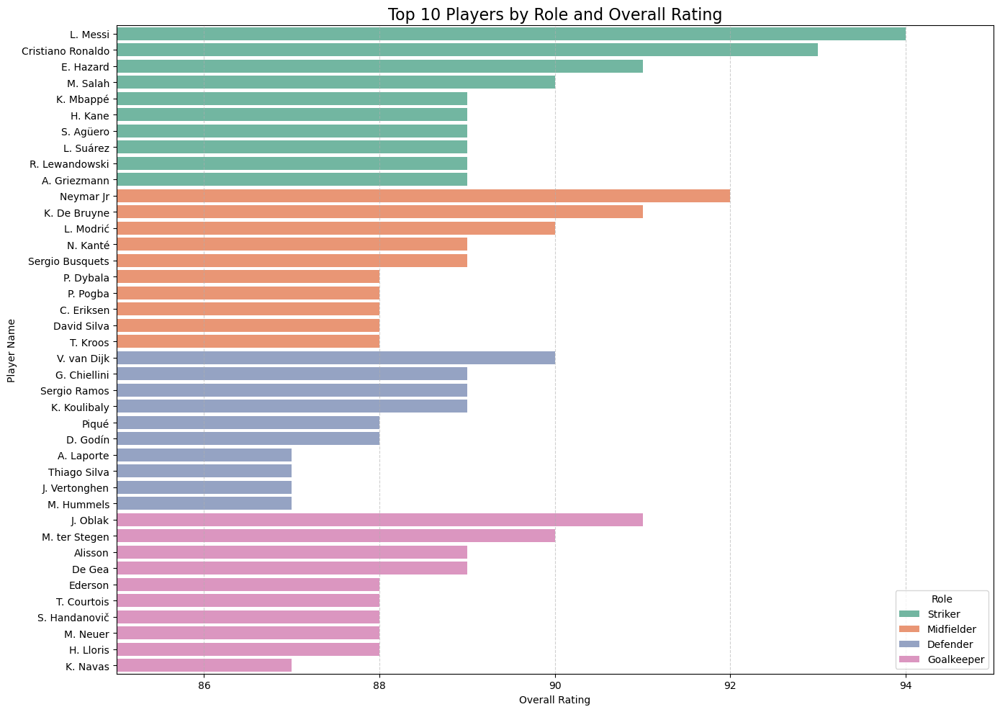

In [55]:
plt.figure(figsize=(14, 10))
sns.barplot(data=top_combined, x='overall', y='short_name', hue='role', dodge=False, palette='Set2')

plt.title("Top 10 Players by Role and Overall Rating", fontsize=16)
plt.xlabel("Overall Rating")
plt.ylabel("Player Name")
plt.xlim(85, 95)  
plt.grid(True, axis='x', linestyle='--', alpha=0.6)
plt.legend(title='Role')
plt.tight_layout()
plt.show()


#### Comparing Players with their Value

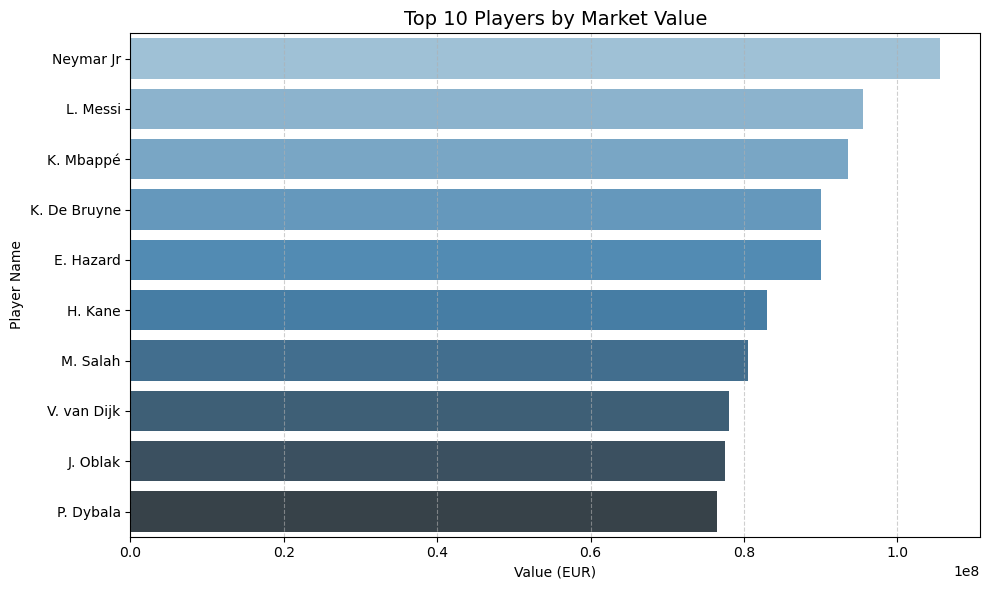

In [57]:
# Get top 10 players by value
top10_value = data2[['short_name', 'value_eur']].sort_values(by='value_eur', ascending=False).head(10)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=top10_value, x='value_eur', y='short_name', palette='Blues_d')

plt.title("Top 10 Players by Market Value", fontsize=14)
plt.xlabel("Value (EUR)")
plt.ylabel("Player Name")
plt.grid(True, axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


# INSIGHTS :
- Neymar Jr. has the highest market value among the top 10 players, exceeding 100 million EUR.

- The market values of the top 10 players are all, ranging from approximately 78 million EUR for P. Dybala to over 100 million EUR for Neymar Jr.

#### Comparing Players with their Wage

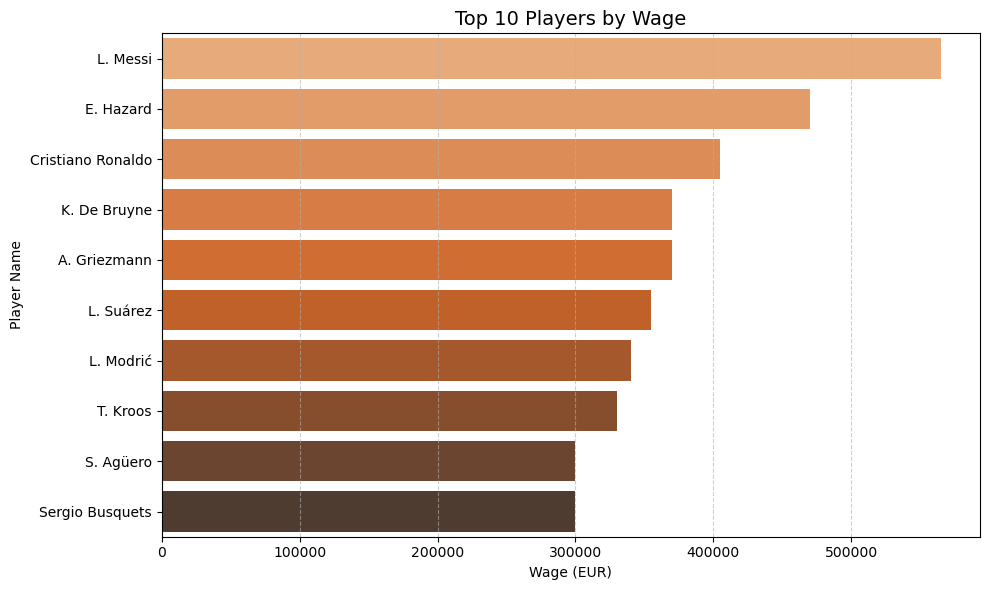

In [59]:
# Get top 10 players by wage
top10_wage = data2[['short_name', 'wage_eur']].sort_values(by='wage_eur', ascending=False).head(10)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=top10_wage, x='wage_eur', y='short_name', palette='Oranges_d')

plt.title("Top 10 Players by Wage", fontsize=14)
plt.xlabel("Wage (EUR)")
plt.ylabel("Player Name")
plt.grid(True, axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


# INSIGHTS :
- There is a significant difference in wages between the top earners (Messi, Hazard, Ronaldo) and the players towards the bottom of this top 10 list.
  
- L. Messi has the highest weekly wage among the top 10 players, exceeding 500,000 EUR.

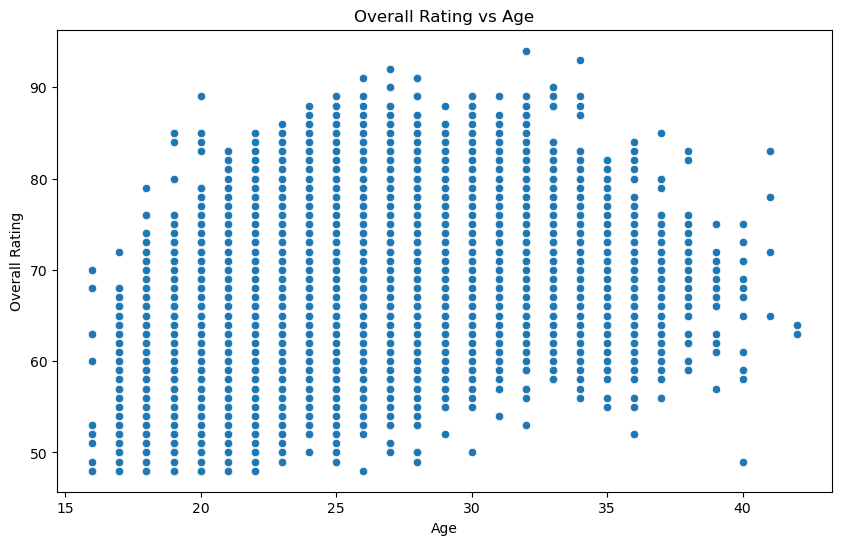

In [60]:
### Overall rating vs Age of players
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data2, x='age', y='overall')
plt.title('Overall Rating vs Age')
plt.xlabel('Age')
plt.ylabel('Overall Rating')
plt.show()

# INSIGHTS :
- Players generally reach their peak overall rating between the ages of approximately 24 and 32.

- The overall rating tends to decline for players after their mid-30s, although some older players still maintain relatively high ratings.

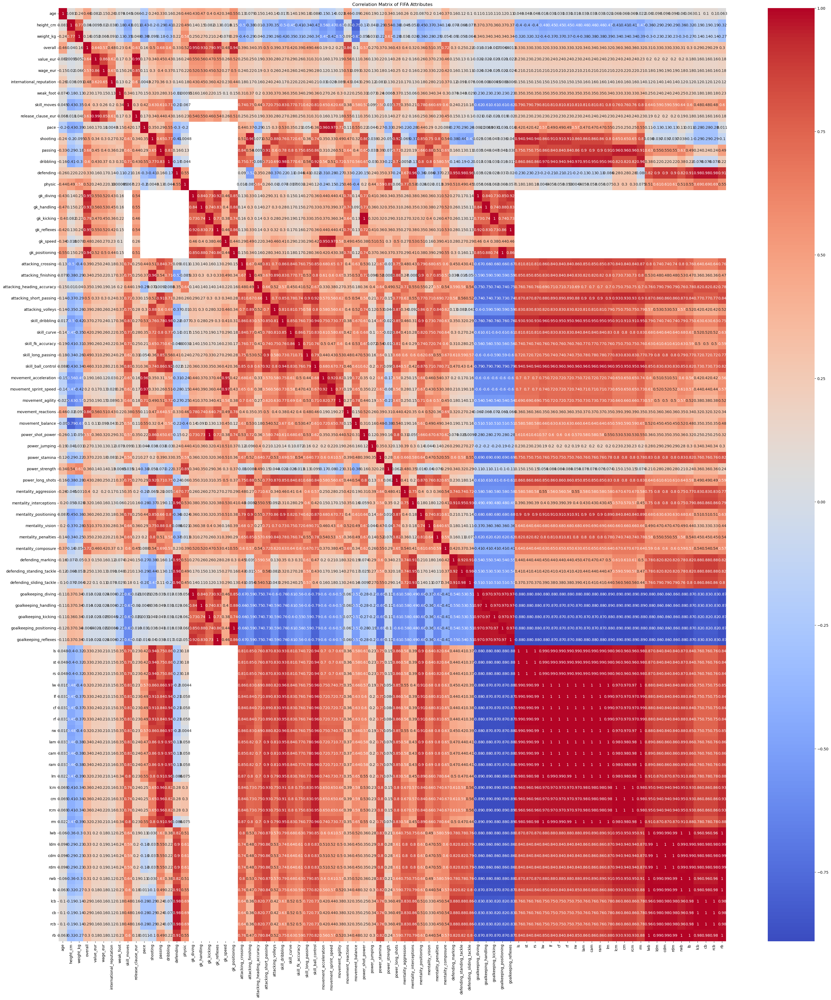

In [61]:
# Corelation Matrix
plt.figure(figsize=(40, 45))
sns.heatmap(data2.select_dtypes(include='number').corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Matrix of FIFA Attributes")
plt.show()


#### Acceleration vs Sprint Speed

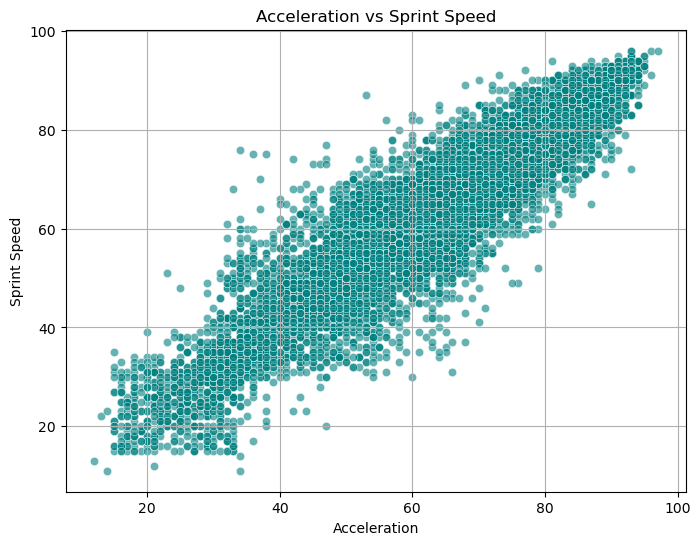

In [63]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data2, x='movement_acceleration', y='movement_sprint_speed', alpha=0.6, color='teal')
plt.title('Acceleration vs Sprint Speed')
plt.xlabel('Acceleration')
plt.ylabel('Sprint Speed')
plt.grid(True)
plt.show()

# INSIGHTS :
- There is a strong positive correlation between a player's acceleration and sprint speed.

- Players with higher acceleration generally also possess higher sprint speed, with the data points forming a clear upward trend.

#### Work rate vs Wage

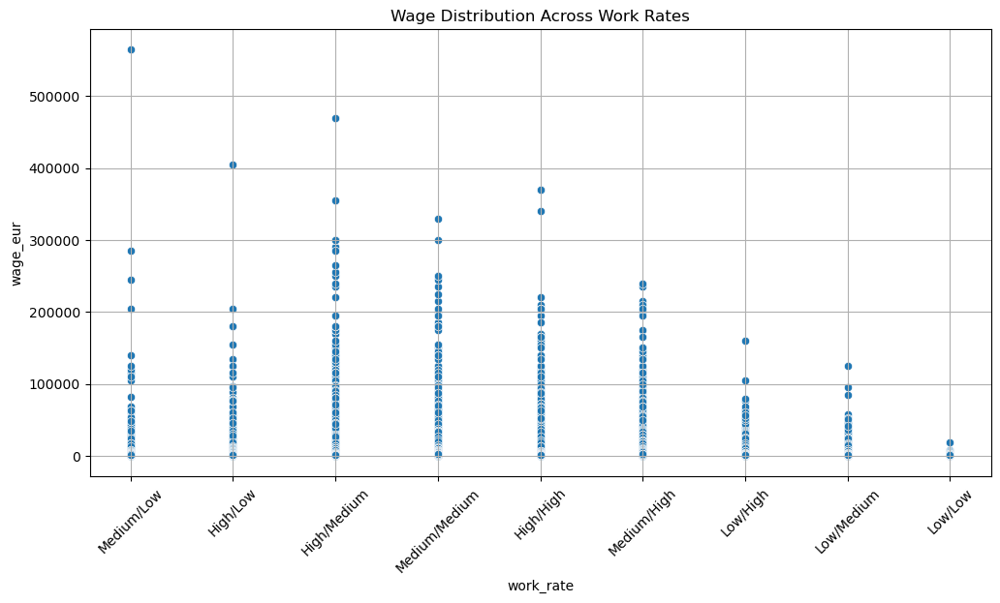

In [65]:
plt.figure(figsize=(12, 6))
top_work_rates = data2['work_rate'].value_counts().nlargest(10).index
filtered_workrate = data2[data2['work_rate'].isin(top_work_rates)]

sns.scatterplot(data=filtered_workrate, x='work_rate', y='wage_eur')
plt.title('Wage Distribution Across Work Rates')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


# INSIGHTS :
- "Medium/Low" work rate shows the highest individual wage, an outlier above 500,000 EUR, but "High/Medium" and "Medium/Medium" work rates have a denser distribution of players earning higher wages overall.

- Players with "Low/Low" work rates generally receive the lowest wages, with a narrow distribution of values compared to other categories.

- The distribution of wages for "High/High" work rates appears to be quite spread out, indicating a variety of wage levels for players who contribute significantly to both attack and defense.

#### Player Value vs Overall Rating

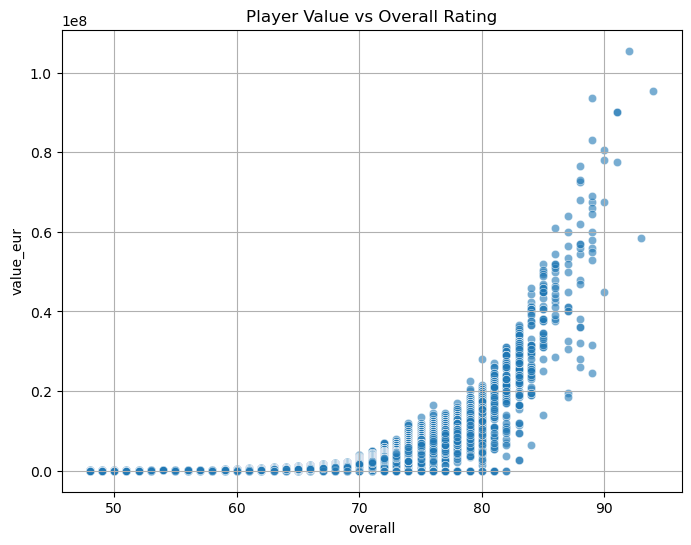

In [67]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data2, x='overall', y='value_eur', alpha=0.6)
plt.title('Player Value vs Overall Rating')
plt.grid(True)
plt.show()

# INSIGHTS :

- Player value rises sharply and rapidly for players with overall ratings above approximately 75, indicating that highly-rated players command significantly higher market values.

- We can see the strong positive correlation between a player's overall rating and their market value, particularly as the overall rating increases.

#### Agility vs Dribbling

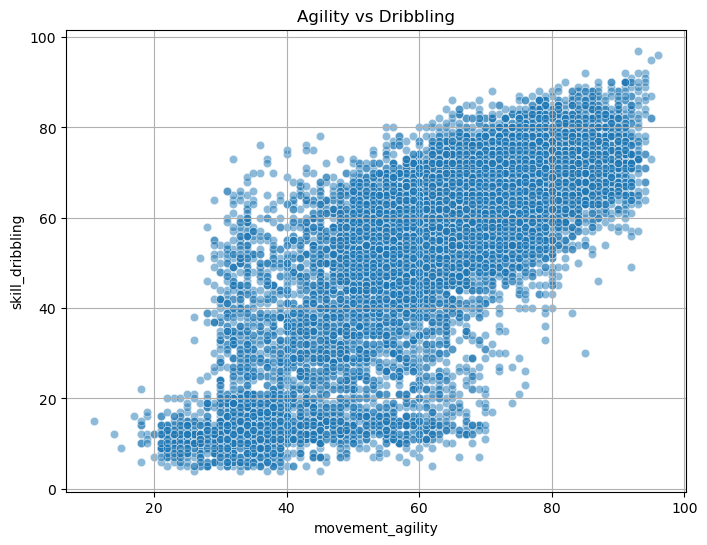

In [69]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data2, x='movement_agility', y='skill_dribbling', alpha=0.5)
plt.title('Agility vs Dribbling')
plt.grid(True)
plt.show()

# INSIGHTS :

- There is a strong positive correlation between a player's agility and their dribbling skill.

- Players with higher movement agility tend to also have higher dribbling skills, forming a clear upward trend in the data.

# Multivariate Analysis

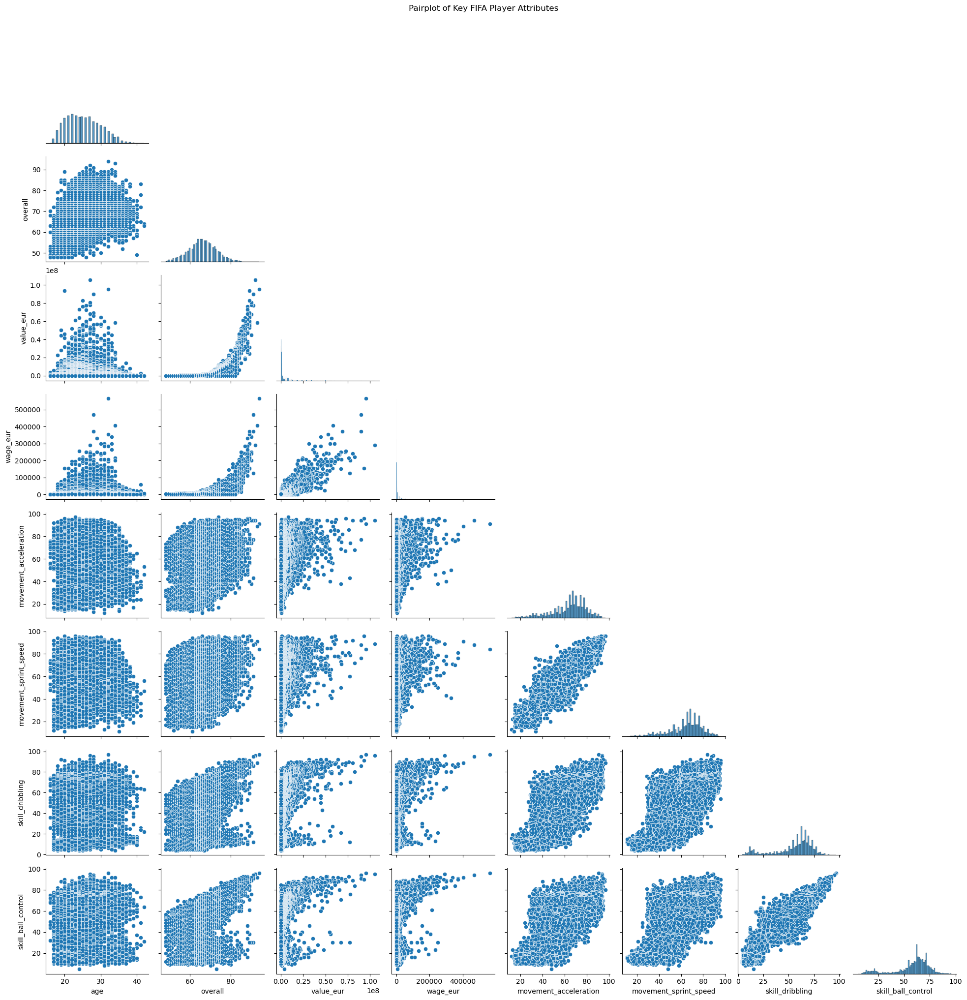

In [71]:
# Select important numerical features
features = [
    'age', 'overall', 'value_eur', 'wage_eur',
    'movement_acceleration', 'movement_sprint_speed',
    'skill_dribbling', 'skill_ball_control'
]

# Drop rows with null values in these columns
df = data2[features].dropna()

# Create pairplot
sns.pairplot(df, corner=True)
plt.suptitle("Pairplot of Key FIFA Player Attributes", y=1.02)
plt.show()

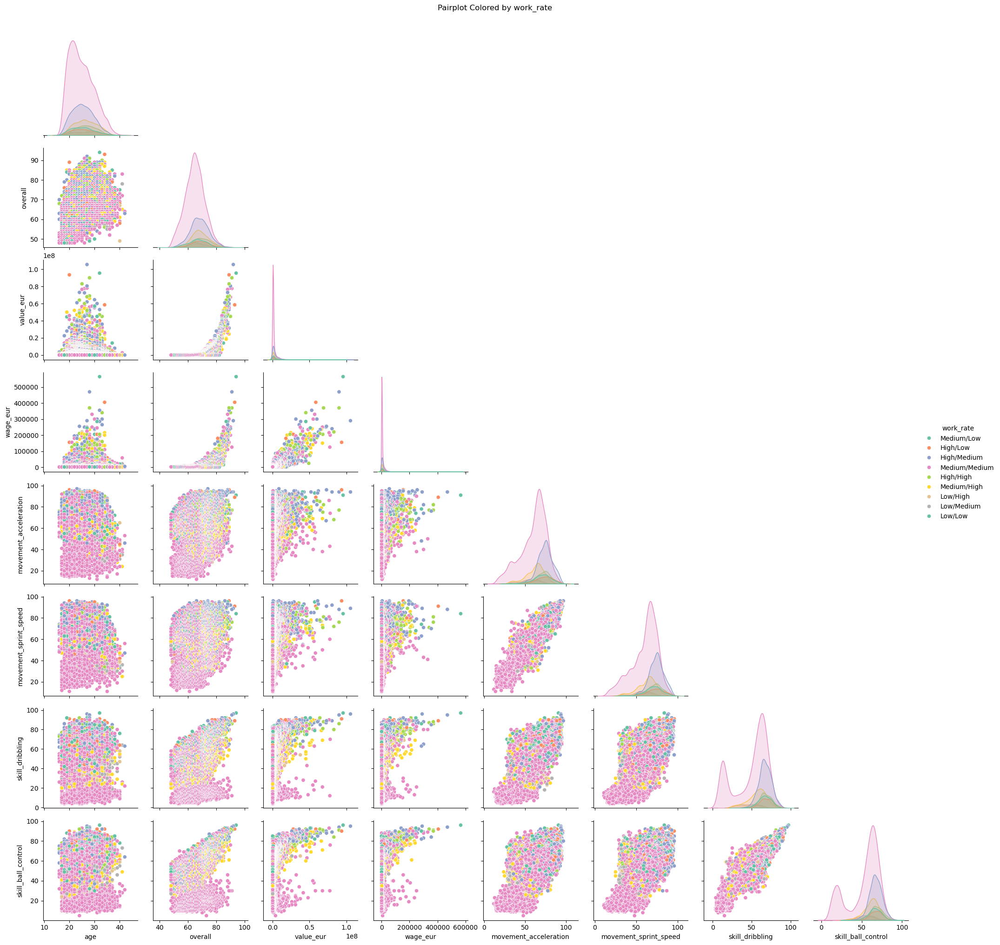

In [72]:
# Pairplot colored by Preffered Foot
df2 = data2[['work_rate'] + features].dropna()
sns.pairplot(df2, hue='work_rate', corner=True, palette='Set2')
plt.suptitle("Pairplot Colored by work_rate", y=1.02)
plt.show()


# TASK 2

In [74]:
data2.columns

Index(['short_name', 'age', 'dob', 'height_cm', 'weight_kg', 'nationality',
       'club', 'overall', 'value_eur', 'wage_eur', 'player_positions',
       'preferred_foot', 'international_reputation', 'weak_foot',
       'skill_moves', 'work_rate', 'release_clause_eur', 'player_tags',
       'team_position', 'nation_position', 'pace', 'shooting', 'passing',
       'dribbling', 'defending', 'physic', 'gk_diving', 'gk_handling',
       'gk_kicking', 'gk_reflexes', 'gk_speed', 'gk_positioning',
       'player_traits', 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'ment

In [75]:
# Dropping Similar columns related to Goal keeping
data2.drop(['gk_diving', 'gk_handling',
       'gk_kicking', 'gk_reflexes', 'gk_speed', 'gk_positioning',], axis=1, inplace=True)

In [76]:
data2.columns

Index(['short_name', 'age', 'dob', 'height_cm', 'weight_kg', 'nationality',
       'club', 'overall', 'value_eur', 'wage_eur', 'player_positions',
       'preferred_foot', 'international_reputation', 'weak_foot',
       'skill_moves', 'work_rate', 'release_clause_eur', 'player_tags',
       'team_position', 'nation_position', 'pace', 'shooting', 'passing',
       'dribbling', 'defending', 'physic', 'player_traits',
       'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_visio

In [77]:
# Displaying null values count for all columns

pd.set_option('display.max_rows', None)

data2.isnull().sum()

short_name                        0
age                               0
dob                               0
height_cm                         0
weight_kg                         0
nationality                       0
club                              0
overall                           0
value_eur                         0
wage_eur                          0
player_positions                  0
preferred_foot                    0
international_reputation          0
weak_foot                         0
skill_moves                       0
work_rate                         0
release_clause_eur             1298
player_tags                   16779
team_position                   240
nation_position               17152
pace                           2036
shooting                       2036
passing                        2036
dribbling                      2036
defending                      2036
physic                         2036
player_traits                 10712
attacking_crossing          

### Treating Null values

#### Replacing null values central tendencies

In [80]:
target_columns1 = ['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic']

In [81]:
for col in target_columns1:
    if col in data2.columns:
        data2[col].fillna(data2[col].mean(), inplace=True)

In [82]:
pd.set_option('display.max_rows', None)


# Now display null values count for all columns
data2.isnull().sum()

short_name                        0
age                               0
dob                               0
height_cm                         0
weight_kg                         0
nationality                       0
club                              0
overall                           0
value_eur                         0
wage_eur                          0
player_positions                  0
preferred_foot                    0
international_reputation          0
weak_foot                         0
skill_moves                       0
work_rate                         0
release_clause_eur             1298
player_tags                   16779
team_position                   240
nation_position               17152
pace                              0
shooting                          0
passing                           0
dribbling                         0
defending                         0
physic                            0
player_traits                 10712
attacking_crossing          

In [83]:
target_columns2 = ['player_tags','team_position', 'nation_position']

In [84]:
for col in target_columns2:
    if col in data2.columns:
        data2[col].fillna(data2[col].mode()[0], inplace=True)

In [85]:
data2['release_clause_eur'].fillna(data2['release_clause_eur'].median(), inplace=True)

In [86]:
data2.drop(['player_traits'], axis=1, inplace=True)

In [87]:
pd.set_option('display.max_rows', None)

data2.isnull().sum()

short_name                    0
age                           0
dob                           0
height_cm                     0
weight_kg                     0
nationality                   0
club                          0
overall                       0
value_eur                     0
wage_eur                      0
player_positions              0
preferred_foot                0
international_reputation      0
weak_foot                     0
skill_moves                   0
work_rate                     0
release_clause_eur            0
player_tags                   0
team_position                 0
nation_position               0
pace                          0
shooting                      0
passing                       0
dribbling                     0
defending                     0
physic                        0
attacking_crossing            0
attacking_finishing           0
attacking_heading_accuracy    0
attacking_short_passing       0
attacking_volleys             0
skill_dr

#### All null values has been Treated

In [89]:
data2.columns

Index(['short_name', 'age', 'dob', 'height_cm', 'weight_kg', 'nationality',
       'club', 'overall', 'value_eur', 'wage_eur', 'player_positions',
       'preferred_foot', 'international_reputation', 'weak_foot',
       'skill_moves', 'work_rate', 'release_clause_eur', 'player_tags',
       'team_position', 'nation_position', 'pace', 'shooting', 'passing',
       'dribbling', 'defending', 'physic', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties

In [90]:
data2['player_tags'] = data2['player_tags'].str.replace(r'[^\w\s]', '', regex=True)

In [91]:
data2.head()

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,value_eur,wage_eur,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,95500000,565000,...,70,68,68,68,70,65,54,54,54,65
1,Cristiano Ronaldo,34,1985-02-05,187,83,Portugal,Juventus,93,58500000,405000,...,68,64,64,64,68,64,56,56,56,64
2,Neymar Jr,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,105500000,290000,...,69,64,64,64,69,64,49,49,49,64
3,J. Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,77500000,125000,...,0,0,0,0,0,0,0,0,0,0
4,E. Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,90000000,470000,...,69,66,66,66,69,64,52,52,52,64


# FEATURE ENGINEERING : 

In [92]:
# Seperating DOB Column

data2[['dob_year', 'dob_month', 'dob_day']] = data2['dob'].str.split('-', expand=True) # splitting

In [93]:
data2[['dob', 'dob_year', 'dob_month', 'dob_day']].head()
# seperated .

,dob,dob_year,dob_month,dob_day
0,1987-06-24,1987,06,24
1,1985-02-05,1985,02,05
2,1992-02-05,1992,02,05
3,1993-01-07,1993,01,07
4,1991-01-07,1991,01,07


In [94]:
# dropping needless columns

data2.drop(['dob_day', 'dob_month', 'dob'], axis=1, inplace=True)

In [1]:
# data2.head(4)

In [96]:
# Removing delimeters for : short_name, club.

data2['short_name'] = data2['short_name'].apply(lambda x: x.replace('.', ' ') if '.' in x else x) # Replacing '.' with '' 

data2['club'] = data2['club'].apply(lambda x: x.replace('-', ' ') if '-' in x else x)# Replacing '-' with ' ' 

In [97]:
data2.head()
# Delimeter removed.

,short_name,age,height_cm,weight_kg,nationality,club,overall,value_eur,wage_eur,player_positions,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,dob_year
0,L Messi,32,170,72,Argentina,FC Barcelona,94,95500000,565000,"RW, CF, ST",...,68,68,68,70,65,54,54,54,65,1987
1,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,58500000,405000,"ST, LW",...,64,64,64,68,64,56,56,56,64,1985
2,Neymar Jr,27,175,68,Brazil,Paris Saint Germain,92,105500000,290000,"LW, CAM",...,64,64,64,69,64,49,49,49,64,1992
3,J Oblak,26,188,87,Slovenia,Atlético Madrid,91,77500000,125000,GK,...,0,0,0,0,0,0,0,0,0,1993
4,E Hazard,28,175,74,Belgium,Real Madrid,91,90000000,470000,"LW, CF",...,66,66,66,69,64,52,52,52,64,1991


In [98]:
data2['work_rate'] = data2['work_rate'].astype(str)   # splitting work_rate column : 

data2[['work_rate1', 'work_rate2']] = data2['work_rate'].str.split('/', expand=True) # two new columns

In [99]:
data2[['work_rate', 'work_rate1', 'work_rate2']].head()

,work_rate,work_rate1,work_rate2
0,Medium/Low,Medium,Low
1,High/Low,High,Low
2,High/Medium,High,Medium
3,Medium/Medium,Medium,Medium
4,High/Medium,High,Medium


In [100]:
# dropping the needless col :
data2.drop(['work_rate'],axis = 1, inplace = True)

In [101]:
data2['player_positions'].max()
# so totally 3 cols

'ST, RWB, LM'

In [102]:
position_split = data2['player_positions'].str.split(',', expand=True)  # Spliting'player_positions'

position_split.columns = [f'player_pos{i+1}' for i in range(position_split.shape[1])] # Renaming columns player_pos1, ...

data2 = pd.concat([data2, position_split], axis=1) # Combining with original dataframe

In [103]:
data2[['player_positions', 'player_pos1', 'player_pos2', 'player_pos3']].head()
# Now we can drop the initial col

,player_positions,player_pos1,player_pos2,player_pos3
0,"RW, CF, ST",RW,CF,ST
1,"ST, LW",ST,LW,None
2,"LW, CAM",LW,CAM,None
3,GK,GK,None,None
4,"LW, CF",LW,CF,None


In [104]:
data2.drop(['player_positions'],axis = 1 , inplace = True)

In [105]:
numerical_cols = data2.select_dtypes(include=['float64', 'int64']).columns
numerical_cols

Index(['age', 'height_cm', 'weight_kg', 'overall', 'value_eur', 'wage_eur',
       'international_reputation', 'weak_foot', 'skill_moves',
       'release_clause_eur', 'pace', 'shooting', 'passing', 'dribbling',
       'defending', 'physic', 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking', 'defending_standing_tackle',
       'defending_sliding_tackle', 'goalkeeping_diving',
       'goalkeeping_

# SCALING

In [107]:
data3 = data2.copy()

In [108]:
# Step 1: Identify column types
categorical_cols = data3.select_dtypes(include=['object']).columns
numerical_cols = data3.select_dtypes(include=['float64', 'int64']).columns

In [109]:
data3.dtypes

short_name                     object
age                             int64
height_cm                       int64
weight_kg                       int64
nationality                    object
club                           object
overall                         int64
value_eur                       int64
wage_eur                        int64
preferred_foot                 object
international_reputation        int64
weak_foot                       int64
skill_moves                     int64
release_clause_eur            float64
player_tags                    object
team_position                  object
nation_position                object
pace                          float64
shooting                      float64
passing                       float64
dribbling                     float64
defending                     float64
physic                        float64
attacking_crossing              int64
attacking_finishing             int64
attacking_heading_accuracy      int64
attacking_sh

### LABEL ENCODING AND SCALING

In [111]:
from sklearn.preprocessing import LabelEncoder

for col in data3.select_dtypes(include='object').columns:
    le = LabelEncoder()
    data3[col] = le.fit_transform(data3[col].astype(str))

In [202]:
#Standard Scaler
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
num_cols = data3.select_dtypes(include=['int64', 'float64']).columns
data3[num_cols] = scaler.fit_transform(data3[num_cols])

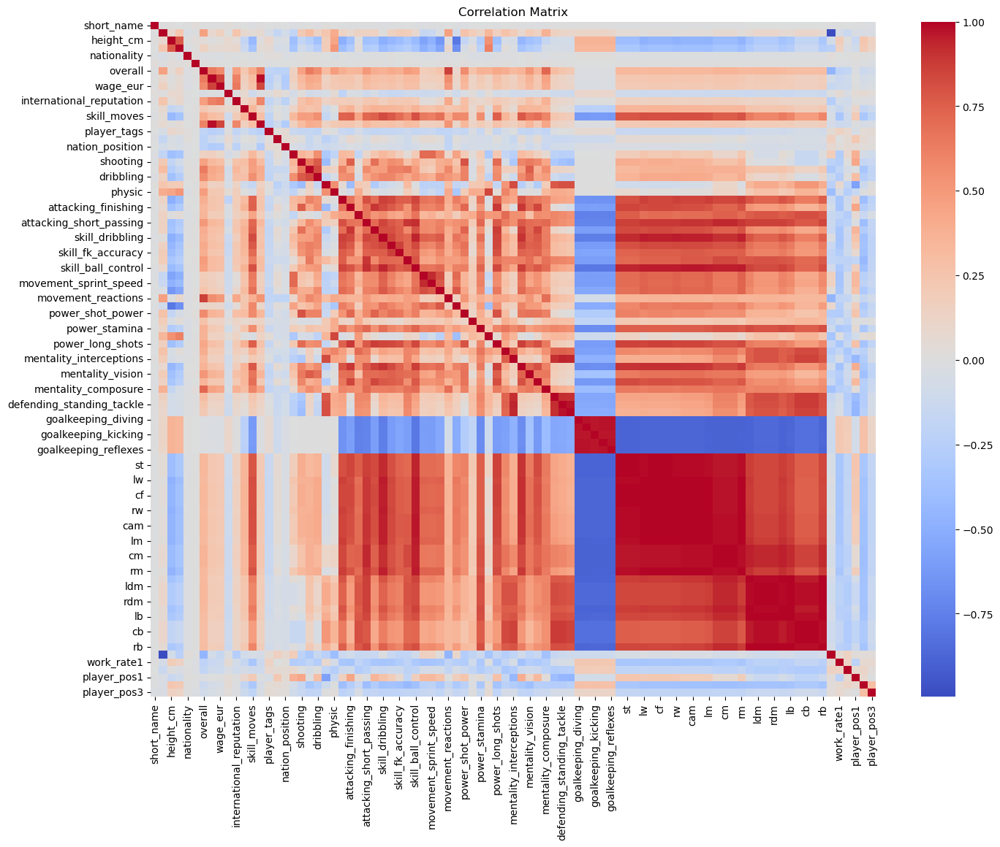

In [204]:
plt.figure(figsize=(16,12))
sns.heatmap(data3.corr(), cmap='coolwarm', annot=False)
plt.title('Correlation Matrix')
plt.show()

In [218]:
# To get highly corelated feature 
pd.set_option('display.max_rows',None)
corrmat = data3.corr()
corrmat = corrmat.abs().unstack()
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat [corrmat >= 0.8] # Set threshold 0.9
corrmat = corrmat [corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1','feature2','corr']
corrmat.head()

,feature1,feature2,corr
0,lf,lam,0.997575
1,lf,ram,0.997575
2,cf,lam,0.997575
3,cf,cam,0.997575
4,cam,cf,0.997575


In [220]:
print(f"Total correlated pairs with corr ≥ 0.8: {len(corrmat)}")


Total correlated pairs with corr ≥ 0.8: 1334


In [222]:
# To get high correlated pairs from your corrmat DataFrame

correlated_pairs = corrmat.copy()  # reuse your result with ['feature1', 'feature2', 'corr']

#  Build a set of columns to drop (drop only one from each pair)
to_drop = set()
already_dropped = set()

for _, row in correlated_pairs.iterrows():
    f1, f2 = row['feature1'], row['feature2']
    
    if f1 not in already_dropped and f2 not in already_dropped:       # Drop f2 only if neither has been dropped already

        to_drop.add(f2)
        already_dropped.add(f2)  # mark it so we don't drop both later

print("Highly correlated features to drop:", to_drop)

#  Dropping them from the data
data3_reduced = data3.drop(columns=to_drop)


Highly correlated features to drop: {'cdm', 'lw', 'overall', 'lam', 'attacking_short_passing', 'defending_standing_tackle', 'mentality_positioning', 'power_shot_power', 'rs', 'cam', 'power_long_shots', 'defending_sliding_tackle', 'lb', 'lwb', 'age', 'rw', 'skill_dribbling', 'ls', 'skill_curve', 'rdm', 'release_clause_eur', 'goalkeeping_reflexes', 'goalkeeping_handling', 'lcb', 'passing', 'rwb', 'lcm', 'goalkeeping_kicking', 'mentality_penalties', 'movement_agility', 'rb', 'mentality_interceptions', 'movement_sprint_speed', 'lm', 'rm', 'attacking_finishing', 'rcb', 'rf', 'skill_ball_control', 'cm', 'cb', 'physic', 'rcm', 'cf', 'goalkeeping_diving', 'st', 'lf', 'value_eur', 'ldm', 'ram'}


In [224]:
print(f"Total correlated pairs with corr ≥ 0.8: {len(corrmat)}")


Total correlated pairs with corr ≥ 0.8: 1334


In [226]:
data3_reduced.shape

(18278, 39)

In [530]:
data3_reduced.columns

Index(['short_name', 'height_cm', 'weight_kg', 'nationality', 'club',
       'wage_eur', 'preferred_foot', 'international_reputation', 'weak_foot',
       'skill_moves', 'player_tags', 'team_position', 'nation_position',
       'pace', 'shooting', 'dribbling', 'defending', 'attacking_crossing',
       'attacking_heading_accuracy', 'attacking_volleys', 'skill_fk_accuracy',
       'skill_long_passing', 'movement_acceleration', 'movement_reactions',
       'movement_balance', 'power_jumping', 'power_stamina', 'power_strength',
       'mentality_aggression', 'mentality_vision', 'mentality_composure',
       'defending_marking', 'goalkeeping_positioning', 'dob_year',
       'work_rate1', 'work_rate2', 'player_pos1', 'player_pos2',
       'player_pos3'],
      dtype='object')

In [231]:
data4 = data3_reduced.copy()

In [233]:
data4.columns

Index(['short_name', 'height_cm', 'weight_kg', 'nationality', 'club',
       'wage_eur', 'preferred_foot', 'international_reputation', 'weak_foot',
       'skill_moves', 'player_tags', 'team_position', 'nation_position',
       'pace', 'shooting', 'dribbling', 'defending', 'attacking_crossing',
       'attacking_heading_accuracy', 'attacking_volleys', 'skill_fk_accuracy',
       'skill_long_passing', 'movement_acceleration', 'movement_reactions',
       'movement_balance', 'power_jumping', 'power_stamina', 'power_strength',
       'mentality_aggression', 'mentality_vision', 'mentality_composure',
       'defending_marking', 'goalkeeping_positioning', 'dob_year',
       'work_rate1', 'work_rate2', 'player_pos1', 'player_pos2',
       'player_pos3'],
      dtype='object')

In [235]:
data4.drop(['short_name','nationality','club','preferred_foot','weak_foot','skill_moves','player_tags','team_position','nation_position'], axis = 1, inplace = True)

In [237]:
data4.shape

(18278, 30)

In [275]:
data3_reduced.shape

(18278, 39)

# PCA

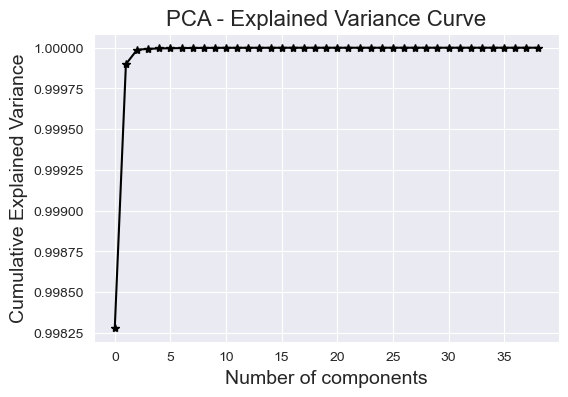

In [277]:
from sklearn.decomposition import PCA

pca = PCA()
principlecomponents = pca.fit_transform(data3_reduced) 

# Plot cumulative explained variance
plt.figure(figsize=(6, 4))
sns.set_style('darkgrid')
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='*', color='k')
plt.xlabel('Number of components', fontsize=14)
plt.ylabel('Cumulative Explained Variance', fontsize=14)
plt.title('PCA - Explained Variance Curve', fontsize=16)
plt.grid(True)
plt.show()


In [279]:
from sklearn.decomposition import PCA

pca = PCA(n_components=5)
pca_components = pca.fit_transform(data3_reduced)  # or scaled_data if you scaled

# Optional: Convert to DataFrame for clarity
pca_df = pd.DataFrame(pca_components, columns=['PC1', 'PC2', 'PC3','PC4','PC5'])
pca_df.head()

,PC1,PC2,PC3,PC4,PC5
0,1061.971522,-123.792274,-69.683203,-49.699884,5.246927
1,-5496.874821,10.872354,45.539819,-4.043979,-7.614942
2,3997.263461,110.608562,-57.364417,-2.502991,-21.025600
3,-810.235054,-281.882954,59.271713,1.027155,-16.519353
4,-4201.676671,163.746093,-64.105326,-5.079523,-7.529017


In [281]:
from sklearn.cluster import KMeans
# Step 1: Use your PCA-reduced data
X = pca_components  # This should be scaled + PCA-transformed data (2 or 3 components)

# Step 2: Try different k values
wcss = []
K_range = range(1, 11)  # Try k from 1 to 10

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)  # inertia_ is the WCSS value


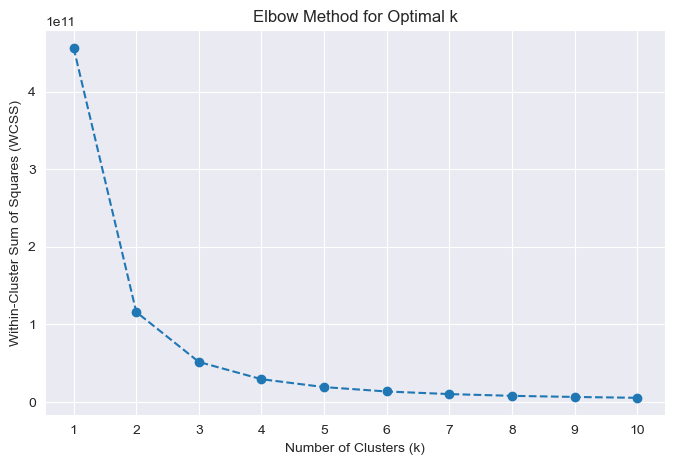

In [283]:
plt.figure(figsize=(8, 5))
plt.plot(K_range, wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(K_range)
plt.grid(True)
plt.show()


In [285]:
best_k = K_range[s_scores.index(max(s_scores))]
print(f"Best number of clusters (k): {best_k}")


Best number of clusters (k): 9


In [287]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


In [289]:
import matplotlib.pyplot as plt

X = pca_components  # your PCA-reduced data (n_components=2 or 3)

s_scores = []
K_range = range(2, 11)  # Try cluster counts from 2 to 10

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)
    score = silhouette_score(X, labels)
    s_scores.append(score)
    print(f"k={k} → Silhouette Score: {score:.4f}")


k=2 → Silhouette Score: 0.6204
k=3 → Silhouette Score: 0.5832
k=4 → Silhouette Score: 0.5608
k=5 → Silhouette Score: 0.5427
k=6 → Silhouette Score: 0.5318
k=7 → Silhouette Score: 0.5183
k=8 → Silhouette Score: 0.5106
k=9 → Silhouette Score: 0.4985
k=10 → Silhouette Score: 0.4904


In [291]:
best_k = K_range[s_scores.index(max(s_scores))]
print(f"Best number of clusters (k): {best_k}")


Best number of clusters (k): 2


In [293]:
kmeans.cluster_centers_

array([[-2.85997430e+03, -2.12134215e-01, -3.34467413e+00,
        -2.55072616e-01, -3.29324445e-01],
       [ 7.76790699e+03,  4.59754777e+00,  2.57782977e-01,
         5.92069417e-02,  3.69090106e-01],
       [ 2.34632559e+03, -5.21301444e+00, -3.10001140e+00,
         2.60541279e-01,  6.48019503e-03],
       [-6.20837010e+03, -1.37385676e+00,  5.92747695e-01,
         1.26162254e-01,  5.87936883e-02],
       [ 5.99468804e+02,  9.62800651e+00, -4.45962459e-01,
         6.12143026e-02, -2.18812460e-01],
       [ 4.11269942e+03, -1.29069128e+01,  2.51853769e+00,
         5.09203130e-04, -1.01376105e-01],
       [-4.54947010e+03,  1.47207485e+01, -7.77856703e-01,
         1.73654782e-01,  1.11424324e-01],
       [ 5.92046716e+03,  8.54308744e-01,  3.86761612e+00,
        -2.34652741e-01, -2.64119426e-01],
       [-7.84537327e+03, -8.18494171e+00,  5.75076307e+00,
        -5.06592459e-02,  1.02744331e-01],
       [-1.12691090e+03, -1.57668635e+00, -5.03722245e+00,
        -1.23585273e-01

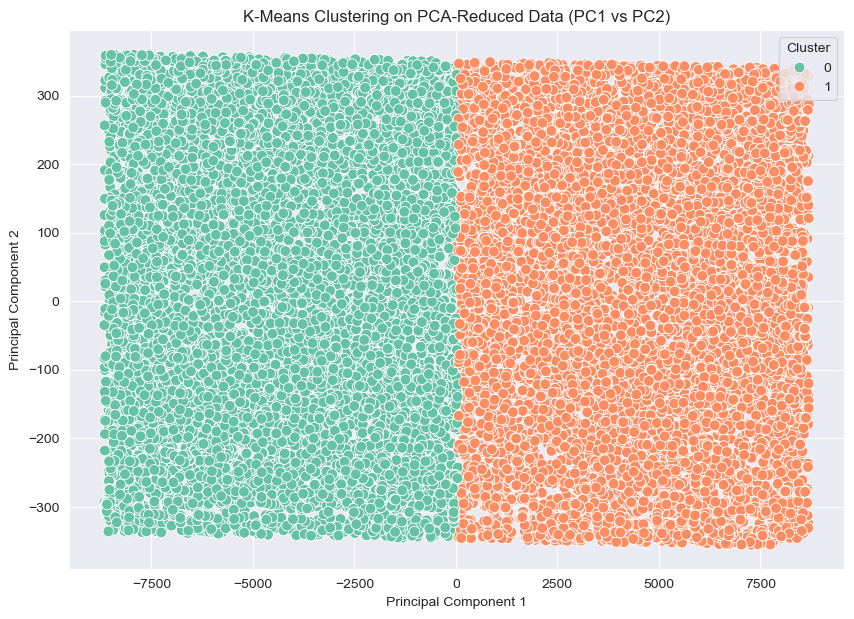

In [295]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# Run KMeans (example with k=3)
kmeans = KMeans(n_clusters=2, random_state=42)
cluster_labels = kmeans.fit_predict(pca_components)

# Add cluster labels to PCA DataFrame
pca_df['Cluster'] = cluster_labels

# Plotting
plt.figure(figsize=(10, 7))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Cluster', palette='Set2', s=60)
plt.title('K-Means Clustering on PCA-Reduced Data (PC1 vs PC2)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


In [299]:
kmeans = KMeans(n_clusters=best_k, random_state=42)
predicted_labels = kmeans.fit_predict(pca_components)
predicted_labels

array([1, 0, 1, ..., 1, 1, 1])

In [301]:
kmeans.cluster_centers_

array([[-4.26418066e+03,  1.03590016e+00, -1.13280172e-01,
        -5.12720391e-02, -7.83054970e-04],
       [ 4.36808139e+03, -1.06114083e+00,  1.16040349e-01,
         5.25213302e-02,  8.02134834e-04]])

In [317]:
from sklearn.decomposition import PCA

pca = PCA(n_components=5)
pca_components = pca.fit_transform(data3_reduced)  # or scaled_data if you scaled
clusters = kmeans.fit_predict(pca_df)


# Optional: Convert to DataFrame for clarity
pca_df = pd.DataFrame(pca_components, columns=['PC1', 'PC2', 'PC3','PC4','PC5'])
pca_df['cluster'] = clusters

# Optional: See the result
pca_df.head()

,PC1,PC2,PC3,PC4,PC5,cluster
0,1061.971522,-123.792274,-69.683203,-49.699884,5.246927,1
1,-5496.874821,10.872354,45.539819,-4.043979,-7.614942,0
2,3997.263461,110.608562,-57.364417,-2.502991,-21.025600,1
3,-810.235054,-281.882954,59.271713,1.027155,-16.519353,0
4,-4201.676671,163.746093,-64.105326,-5.079523,-7.529017,0


# Logistic Regression for Classification

In [336]:
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler        


cluster_labels = kmeans.fit_predict(pca_components)  # data can be original or PCA features

#Setting up features (X) and labels (y)
X = data3_reduced            
y = pca_df.iloc[:,-1]  

In [339]:
# Logistic regression Model 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Logistic Regression model
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)

y_pred = lr_model.predict(X_test)



In [341]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1815
           1       0.98      0.98      0.98      1841

    accuracy                           0.98      3656
   macro avg       0.98      0.98      0.98      3656
weighted avg       0.98      0.98      0.98      3656



## CHALLENGES FACED :

1. Data Cleaning & Preprocessing Handling missing values and inconsistent formats (e.g., converting '€20M', '€100K' to float),Standardizing and        normalizing data using scalers like MinMaxScaler or StandardScaler before clustering and PCA.

 2. Feature Selection & Dimensionality Reduction - High correlation among features like Overall, Potential, Value, and Wage required dimensionality reduction (PCA).

Selecting only meaningful features to avoid bias in clustering due to dominant attributes.

 3. Plot Comparison Difficulties - Difficulty in visually comparing clusters afcross multiple clustering methods (e.g., K-Means vs Agglomerative Clustering).

   Overlap of data points in 2D PCA space made cluster separation less visually obvious, Some clusters looked visually close but were separated in high-    dimensional space — making validation harder with only 2D plots.

4. Clustering Challenges
 Deciding the Number of Clusters:
  Elbow Method showed diminishing returns after 3–5 clusters, but:

  3 clusters were too broad (e.g., attackers, midfielders, defenders all grouped).

  2 clusters gave better player segmentation by role and skill level.

  Silhouette Score peaked around 4 or 5 clusters, which was chosen for final K-Means

 5. Interpretability & Validation
    
  Limited labeled data made it harder to evaluate accuracy or usefulness of clusters.

  Visualizing clusters meaningfully required PCA, which reduced interpretability of axes.



